## Notebook to run post processing of differential expression in single-cell data using glmmTMB

basically 
- read glmmTMB r script results per region and cell-type and then integrate them
- apply B&H FDR 
- take a look at overlap between brain regions and cell-types do some sample plotting

In [1]:
!date

Wed Jan  3 20:43:41 UTC 2024


#### import libraries

In [2]:
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import rc_context
import json
from os.path import exists

import warnings
warnings.simplefilter('ignore')

import random
random.seed(420)

#### set notebook variables

In [3]:
# parameters
cohort = 'aging'
assay = 'RNA'

# directories for initial setup
wrk_dir = '/home/jupyter/brain_aging_phase1'
quants_dir = f'{wrk_dir}/demux'
results_dir = f'{wrk_dir}/results'

# in files
# data_file = f'{quants_dir}/{cohort}.pegasus.leiden_085.Age_group_young_old.h5ad'
data_file = f'{quants_dir}/{cohort}.pegasus.leiden_085.subclustered.h5ad'
temp_name_remap_json = '{this_dir}/{name}_gene_name_remap_temp.csv'
temp_r_out_file = '{this_dir}/{chrt}.{name}_glmmtmb_results_temp.csv'
diffxpy_out_file = '{this_dir}/{name}_de_diffxpy.csv'

# out files
results_file = f'{results_dir}/{cohort}.glmmtmb_age_diffs.csv'
results_fdr_file = f'{results_dir}/{cohort}.glmmtmb_age_diffs_fdr.csv'
diffxpy_file = f'{results_dir}/{cohort}.diffxpy_age_diffs.csv'
diffxpy_fdr_file = f'{results_dir}/{cohort}.diffxpy_age_diffs_fdr.csv'

# constants
DEBUG = True
min_cell_count = 3
young_age_limit = 30.0


sns.set_theme(style='white', palette='Paired', font_scale=1.2)

# allow for more rows in output
prev_default = pd.get_option('max_rows')
pd.set_option('max_rows', 2000)    
# # restore default setting
# pd.set_option('max_rows',prev_default)

#### analysis functions

In [4]:
def read_diffxpy_results(group_name: str, group_type: str) -> pd.DataFrame:
    this_file = diffxpy_out_file.format(this_dir=quants_dir, 
                                        name=group_name.replace(" ", "_"))
    if exists(this_file):
        de_df = pd.read_csv(this_file, index_col=0)
        de_df['tissue'] = group_name
        de_df['type'] = group_type        
    else:
        de_df = None
    return de_df

def read_feature_renamed_map(group_name: str) -> dict:
    # read dict from json file
    rename_cols = json.load(open(temp_name_remap_json.format(this_dir=quants_dir,
                                                             name=group_name.replace(" ", "_"))))
    return rename_cols

def reformat_glmmtmb_df(df: pd.DataFrame) -> pd.DataFrame:
    # reformat results into one row per feature
    temp_term = df.loc[df['term'] == 'old'].copy()
    temp_intercepts = df.loc[df['term'] == '(Intercept)', ['feature', 'estimate']].copy()
    temp_intercepts = temp_intercepts.rename(columns={'estimate': 'intercept'})
    this_df = temp_term.merge(temp_intercepts, how='inner', on='feature')
    return this_df[['feature', 'intercept', 'estimate', 'std.error', 'statistic', 'p.value']]

def read_glmmtmb_results(group_name: str, group_type: str, cols_to_rename: dict) -> pd.DataFrame:
    this_file = temp_r_out_file.format(this_dir=results_dir, chrt=cohort, 
                                       name=group_name.replace(" ", "_"))
    if exists(this_file):
        this_df = pd.read_csv(this_file)
        # need to flip the features with '-' -> '_' for R back to originals
        # the the key/values
        rename_cols = {value: key for (key, value) in cols_to_rename.items()}
        this_df['feature'] = this_df['feature'].replace(rename_cols)
        this_df = reformat_glmmtmb_df(this_df)
        this_df['tissue'] = group_name
        this_df['type'] = group_type     
    else:
        this_df = None
    return this_df

def compute_bh_fdr(df: pd.DataFrame, alpha: float=0.05, p_col: str='p.value',
                   method: str='fdr_bh', verbose: bool=True) -> pd.DataFrame:
    ret_df = df.copy()
    test_adjust = multipletests(np.array(ret_df[p_col]), alpha=alpha, 
                                method=method)
    ret_df[method] = test_adjust[1]
    if verbose:
        print(f'total significant after correction: {ret_df.loc[ret_df[method] < alpha].shape}')
    return ret_df

def plot_feature_by_age_group(df: pd.DataFrame, x_term: str, y_term: str):
    plt.figure(figsize=(9,9))
    sns.boxenplot(x=x_term,y=y_term, scale='exponential', data=df,
                  k_depth='trustworthy')

    grsplt = sns.stripplot(x=x_term,y=y_term, data=df, alpha=0.75,
                           jitter=True, color='darkgrey')
    plt.title(f'{y_term} ~ {x_term}', fontsize='large') 
    plt.xlabel(x_term)
    plt.ylabel(y_term)
    plt.show()
    
def plot_feature_by_sample(df: pd.DataFrame, x_term: str, y_term: str):
    # set up order by young then old
    temp = df.groupby('Age_group')['Sample_id'].unique()
    this_list = temp['young'].to_list() + temp['old'].to_list()    
    plt.figure(figsize=(9,9))
    sns.boxenplot(x='Sample_id',y=y_term, scale='exponential', data=df,
                  k_depth='trustworthy', hue=x_term, order=this_list)
    grsplt = sns.stripplot(x='Sample_id',y=y_term, data=df, alpha=0.75,
                           jitter=True, color='darkgrey', order=this_list)
    plt.xticks(rotation=75)
    plt.title(f'{y_term} ~ {x_term}', fontsize='large') 
    plt.xlabel('Sample')
    plt.ylabel(y_term)
    plt.show()    
    
def volcano_plot(df: pd.DataFrame, x_term: str='estimate', y_term: str='p.value', 
                 alpha: float=0.05, adj_p_col: str='fdr_bh', title: str=None, 
                 filter_nseeff: bool=True, extreme_size: float=10.0):
    if filter_nseeff:
        df = df.loc[((-extreme_size < df[x_term]) & 
                    (df[x_term] < extreme_size) &
                    (~df['statistic'].isna()) | 
                    (df[adj_p_col] < alpha))]
    plt.figure(figsize=(9,9))
    log_pvalue = -np.log10(df[y_term])
    is_sig = df[adj_p_col] < alpha
    sns.scatterplot(x=x_term, y=log_pvalue, data=df, hue=is_sig)
    plt.title(title)
    plt.xlabel('effect')
    plt.ylabel('-log10(p-value)')
    plt.show()
    
def prep_plot_feature(data: AnnData, feature_results: pd.Series, 
                      group: str='old', filter_zeros: bool=False):
    this_ad = subset_ad_by_type(data, feature_results.tissue, feature_results.type)
    this_df = convert_ad_to_df(this_ad)
    if filter_zeros:
        this_df = this_df.loc[this_df[feature_results.feature] > 0]
    print(feature_results)
    sns.set_theme(style='white', palette='Paired', font_scale=1.2)
    plot_feature_by_age_group(this_df, group, feature_results.feature)
    plot_feature_by_sample(this_df, group, feature_results.feature)
    
def subset_ad_by_type(data: AnnData, group_name: str, type_name: str,
                      reapply_filter: bool=True, min_cell_count: int=3,
                      verbose: bool=False) -> AnnData:
    if type_name == 'region_broad_celltype':
        name_parts = group_name.split(' ')
        broad_cell_name = name_parts[len(name_parts)-1]
        region_name = ' '.join(name_parts[:-1]).rstrip()
        this_data = data[(data.obs.Brain_region == region_name) & 
                         (data.obs.broad_celltype == broad_cell_name)].copy()
    elif type_name == 'broad_celltype':
        this_data = data[data.obs.broad_celltype == group_name].copy()        
    else:
        this_data = data[data.obs.new_anno == group_name].copy()
    shape_before = this_data.shape
    if reapply_filter:
        sc.pp.filter_genes(this_data, min_counts=min_cell_count)
        sc.pp.filter_cells(this_data, min_counts=min_cell_count)
        shape_after = this_data.shape
    if verbose:
        print(f'shape before and after: {shape_before} {shape_after}')
        print(this_data)
    return this_data

def convert_ad_to_df(data: AnnData, young_age_limit: float=30.0, 
                     verbose: bool=False) -> pd.DataFrame:
    data_df = data.to_df()
    annots = data.obs[['Brain_region', 'Age','Age_group', 'pool_name', 
                       'Sample_id', 'Sex', 'donor_id']].copy()
    annots['old'] = np.where((annots['Age'] > young_age_limit), 1, 0)
    annots['female'] = np.where((annots['Sex'] == 'Female'), 1, 0)
    this_df = None
    if data_df.index.equals(annots.index):
        this_df = pd.concat([data_df, annots], axis='columns')
        if verbose:
            print(this_df.shape)
            display(this_df.head())
    return this_df

#### read the anndata (h5ad) file

In [5]:
%%time
adata = sc.read(data_file, cache=True)
print(adata)

Only considering the two last: ['.subclustered', '.h5ad'].
Only considering the two last: ['.subclustered', '.h5ad'].
AnnData object with n_obs × n_vars = 167945 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle',

#### take a look at the cell counts by cell type
'categories' are broad cell-types, broad cell-types by brain regions, and specific cell-type clusters

In [6]:
# broad cell-type not region specific
display(adata.obs.broad_celltype.value_counts())
# brain regsion specific broad cell-types
regions = adata.obs.Brain_region.unique()
if DEBUG:
    print(regions)
for region in regions:
    print(f'#### {region} ####')
    display(adata.obs[adata.obs.Brain_region == region].broad_celltype.value_counts())
# specific cell-type clusters
print('#### counts by cluster specific cell-types ####')
display(adata.obs.new_anno.value_counts())

Oligodendrocyte      50129
SPN                  33512
ExN                  28483
InN                  17733
Other                12753
Astrocyte            11289
OPC                   6682
Microglia             3265
Ependymal             1853
Mural                 1293
Endothelial            953
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

['Middle temporal gyrus', 'Putamen', 'Entorhinal cortex', 'Subventricular zone']
Categories (4, object): ['Entorhinal cortex', 'Middle temporal gyrus', 'Putamen', 'Subventricular zone']
#### Middle temporal gyrus ####


ExN                  12331
InN                   6043
Oligodendrocyte       4287
Other                 1917
OPC                    869
Astrocyte              867
SPN                    368
Microglia              258
Mural                  195
Endothelial            170
Ependymal                6
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
ExN FEZF2                0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

#### Putamen ####


SPN                  29967
Oligodendrocyte       8968
Other                 3136
Astrocyte             2136
InN                   2099
OPC                   2069
Microglia              670
Mural                  359
Endothelial            169
ExN                     40
Ependymal               12
ExN FEZF2                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1                   0
SPN D1-2                 0
ExN LAMP5                0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
ExN RORB                 0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

#### Entorhinal cortex ####


ExN                  16056
Oligodendrocyte      10458
InN                   9084
Other                 6843
Astrocyte             4198
OPC                   2875
SPN                   1868
Microglia             1219
Ependymal              811
Mural                  515
Endothelial            472
ExN FEZF2                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1                   0
SPN D1-2                 0
ExN LAMP5                0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
ExN RORB                 0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

#### Subventricular zone ####


Oligodendrocyte      26416
Astrocyte             4088
SPN                   1309
Microglia             1118
Ependymal             1024
OPC                    869
Other                  857
InN                    507
Mural                  224
Endothelial            142
ExN                     56
ExN RORB THEMIS          0
ExN THEMIS               0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D2                   0
SPN D1-2                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
ExN LAMP5                0
ExN RORB                 0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

#### counts by cluster specific cell-types ####


Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            11289
ExN CUX2 LAMP5        9055
uncertain             7548
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
uncertain-2           2677
SPN D1-2              2388
ExN RORB              1966
ExN LAMP5             1963
uncertain-3           1929
Ependymal             1853
Mural                 1293
Endothelial            953
Oligodendrocyte-3      806
Astrocyte-GFAP-Hi      599
SPN D2-2               465
ExN THEMIS             461
Radial Glia              0
Name: new_anno, dtype: int64

#### get sample counts per age group by counts by cell-type 'categories' (see above)

In [7]:
# broad cell-type not region specific
display(adata.obs.groupby(['broad_celltype','Age_group'])['Sample_id'].nunique())
# brain regsion specific broad cell-types
for region in regions:
    print(f'#### {region} ####')
    display(adata.obs[adata.obs.Brain_region == region].groupby(['broad_celltype','Age_group'])['Sample_id'].nunique())        
print('#### counts by cluster specific cell-types ####')
display(adata.obs.groupby(['new_anno','Age_group'])['Sample_id'].nunique())    

broad_celltype     Age_group
Astrocyte          old          26
                   young        22
Astrocyte-GFAP-Hi  old           0
                   young         0
Endothelial        old          26
                   young        22
ExN CUX2 ADARB2    old           0
                   young         0
ExN CUX2 LAMP5     old           0
                   young         0
ExN FEZF2          old           0
                   young         0
ExN LAMP5          old           0
                   young         0
ExN RORB           old           0
                   young         0
ExN RORB THEMIS    old           0
                   young         0
ExN THEMIS         old           0
                   young         0
InN ADARB2 LAMP5   old           0
                   young         0
InN ADARB2 VIP     old           0
                   young         0
InN LHX6 PVALB     old           0
                   young         0
InN LHX6 SST       old           0
                   young  

#### Middle temporal gyrus ####


broad_celltype     Age_group
Astrocyte          old          7
                   young        5
Astrocyte-GFAP-Hi  old          0
                   young        0
Endothelial        old          7
                   young        5
ExN CUX2 ADARB2    old          0
                   young        0
ExN CUX2 LAMP5     old          0
                   young        0
ExN FEZF2          old          0
                   young        0
ExN LAMP5          old          0
                   young        0
ExN RORB           old          0
                   young        0
ExN RORB THEMIS    old          0
                   young        0
ExN THEMIS         old          0
                   young        0
InN ADARB2 LAMP5   old          0
                   young        0
InN ADARB2 VIP     old          0
                   young        0
InN LHX6 PVALB     old          0
                   young        0
InN LHX6 SST       old          0
                   young        0
Microglia          

#### Putamen ####


broad_celltype     Age_group
Astrocyte          old          7
                   young        5
Astrocyte-GFAP-Hi  old          0
                   young        0
Endothelial        old          7
                   young        5
ExN CUX2 ADARB2    old          0
                   young        0
ExN CUX2 LAMP5     old          0
                   young        0
ExN FEZF2          old          0
                   young        0
ExN LAMP5          old          0
                   young        0
ExN RORB           old          0
                   young        0
ExN RORB THEMIS    old          0
                   young        0
ExN THEMIS         old          0
                   young        0
InN ADARB2 LAMP5   old          0
                   young        0
InN ADARB2 VIP     old          0
                   young        0
InN LHX6 PVALB     old          0
                   young        0
InN LHX6 SST       old          0
                   young        0
Microglia          

#### Entorhinal cortex ####


broad_celltype     Age_group
Astrocyte          old          6
                   young        6
Astrocyte-GFAP-Hi  old          0
                   young        0
Endothelial        old          6
                   young        6
ExN CUX2 ADARB2    old          0
                   young        0
ExN CUX2 LAMP5     old          0
                   young        0
ExN FEZF2          old          0
                   young        0
ExN LAMP5          old          0
                   young        0
ExN RORB           old          0
                   young        0
ExN RORB THEMIS    old          0
                   young        0
ExN THEMIS         old          0
                   young        0
InN ADARB2 LAMP5   old          0
                   young        0
InN ADARB2 VIP     old          0
                   young        0
InN LHX6 PVALB     old          0
                   young        0
InN LHX6 SST       old          0
                   young        0
Microglia          

#### Subventricular zone ####


broad_celltype     Age_group
Astrocyte          old          6
                   young        6
Astrocyte-GFAP-Hi  old          0
                   young        0
Endothelial        old          6
                   young        6
ExN CUX2 ADARB2    old          0
                   young        0
ExN CUX2 LAMP5     old          0
                   young        0
ExN FEZF2          old          0
                   young        0
ExN LAMP5          old          0
                   young        0
ExN RORB           old          0
                   young        0
ExN RORB THEMIS    old          0
                   young        0
ExN THEMIS         old          0
                   young        0
InN ADARB2 LAMP5   old          0
                   young        0
InN ADARB2 VIP     old          0
                   young        0
InN LHX6 PVALB     old          0
                   young        0
InN LHX6 SST       old          0
                   young        0
Microglia          

#### counts by cluster specific cell-types ####


new_anno           Age_group
Astrocyte          old          26
                   young        22
Astrocyte-GFAP-Hi  old           0
                   young         1
Endothelial        old          26
                   young        22
ExN CUX2 ADARB2    old           8
                   young         8
ExN CUX2 LAMP5     old          24
                   young        20
ExN FEZF2          old          15
                   young        13
ExN LAMP5          old           7
                   young         6
ExN RORB           old           8
                   young         8
ExN RORB THEMIS    old          14
                   young        12
ExN THEMIS         old           9
                   young         6
InN ADARB2 LAMP5   old          26
                   young        22
InN ADARB2 VIP     old          26
                   young        21
InN LHX6 PVALB     old          25
                   young        20
InN LHX6 SST       old          24
                   young  

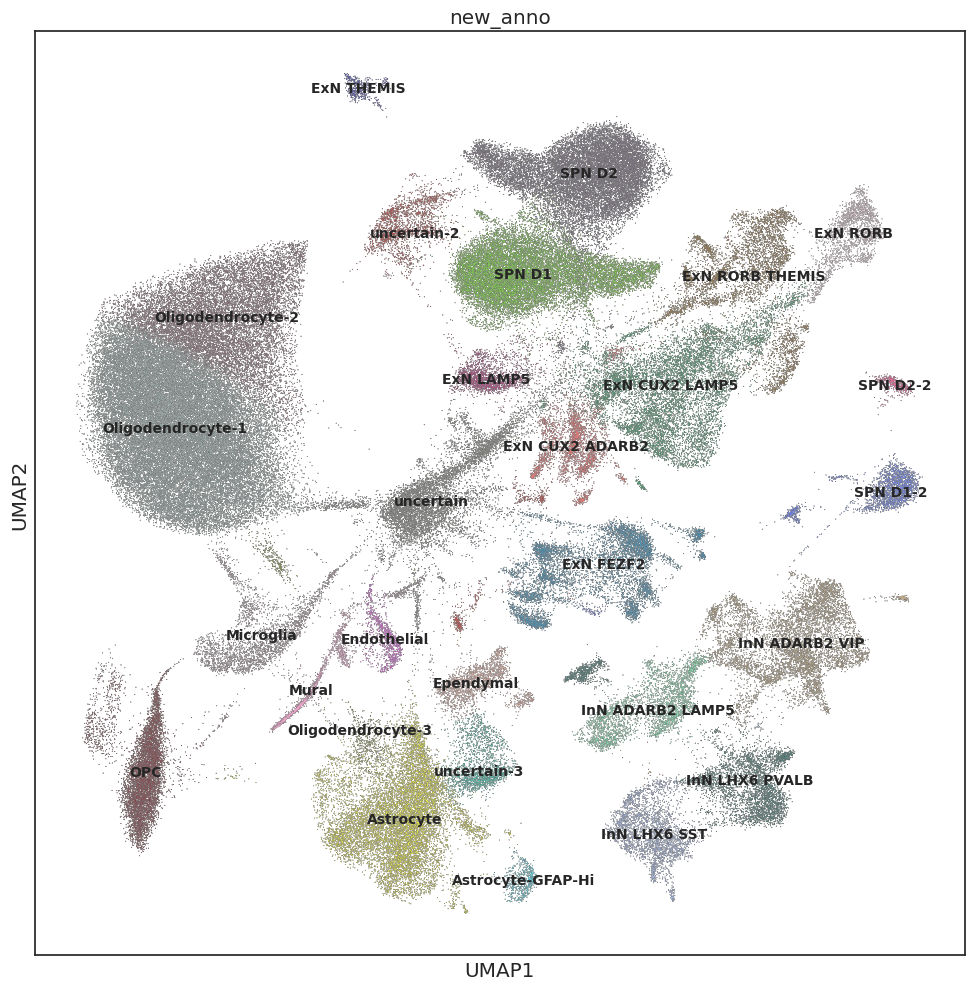

In [8]:
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color=['new_anno'], legend_loc='on data', 
               add_outline=True, legend_fontsize=10)

##### find cell-types not used in analysis
remove them, and then refilter genes based on cell count

In [9]:
found_uncertain = [x for x in adata.obs['new_anno'].unique().to_list() 
                   if 'uncertain' in x] + ['Astrocyte-GFAP-Hi']
print(found_uncertain)
adata = adata[~adata.obs['new_anno'].isin(found_uncertain ), :]
sc.pp.filter_genes(adata, min_cells=min_cell_count)
print(adata)

['uncertain', 'uncertain-2', 'uncertain-3', 'Astrocyte-GFAP-Hi']
AnnData object with n_obs × n_vars = 155192 × 34596
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap

### read the diff by age results by region and cell-type

In [10]:
%%time
diffxpy_results = None
glmmtmb_results = None
this_type = 'broad_celltype'
for broad_celltype in adata.obs.broad_celltype.unique():
    diffxpy_results = pd.concat([diffxpy_results, 
                                 read_diffxpy_results(broad_celltype, this_type)])
    renamed_features = read_feature_renamed_map(broad_celltype)
    glmmtmb_results = pd.concat([glmmtmb_results, 
                                 read_glmmtmb_results(broad_celltype, this_type,
                                                      renamed_features)])
this_type = 'region_broad_celltype'
for region in regions:
    for broad_type in adata.obs.broad_celltype.unique():
        this_tissue = f'{region} {broad_type}'
        diffxpy_results = pd.concat([diffxpy_results, 
                                     read_diffxpy_results(this_tissue, this_type)])
        renamed_features = read_feature_renamed_map(this_tissue)
        glmmtmb_results = pd.concat([glmmtmb_results, 
                                     read_glmmtmb_results(this_tissue, this_type,
                                                          renamed_features)])
this_type = 'specific_celltype'
for specific_type in adata.obs.new_anno.unique():
    diffxpy_results = pd.concat([diffxpy_results, 
                                 read_diffxpy_results(specific_type, this_type)])
    renamed_features = read_feature_renamed_map(specific_type)
    glmmtmb_results = pd.concat([glmmtmb_results, 
                                 read_glmmtmb_results(specific_type, this_type,
                                                      renamed_features)])

CPU times: user 31.7 s, sys: 292 ms, total: 32 s
Wall time: 32 s


In [11]:
if DEBUG:
    print(diffxpy_results.shape)
    display(diffxpy_results.sample(5))
    print(glmmtmb_results.shape)
    display(glmmtmb_results.sample(5))

(969583, 9)


,gene,pval,qval,log2fc,mean,zero_mean,zero_variance,tissue,type
15113,AC093801.1,0.248998,0.442058,0.329140,0.028047,False,False,Astrocyte,specific_celltype
3367,ANKAR,0.981344,0.990907,0.000881,1.158587,False,False,Astrocyte,broad_celltype
3256,AC036214.1,0.777285,0.932742,0.095946,0.113600,False,False,Putamen OPC,region_broad_celltype
5820,AC073254.1,0.097504,0.178832,0.526327,0.027227,False,False,Middle temporal gyrus InN,region_broad_celltype
2731,DTD1,0.871854,0.985423,-0.044458,0.915574,False,False,Middle temporal gyrus Microglia,region_broad_celltype


(387117, 8)


,feature,intercept,estimate,std.error,statistic,p.value,tissue,type
341,PTGES3,0.166449,-0.459778,0.227940,-2.017103,0.043685,Middle temporal gyrus Microglia,region_broad_celltype
2894,TRPC4,-1.156802,-0.359078,0.196968,-1.823033,0.068298,Microglia,specific_celltype
1471,FAM193B,-0.772043,0.247116,0.081466,3.033362,0.002418,Middle temporal gyrus Oligodendrocyte,region_broad_celltype
1066,FCER1G,-4.225807,-1.239624,0.361917,-3.425157,0.000614,Putamen SPN,region_broad_celltype
7530,AP001092.1,-2.821099,-0.231582,0.168520,-1.374207,0.169378,SPN,broad_celltype


#### result counts for diffxpy results by type

In [12]:
display(diffxpy_results.groupby('type')['tissue'].value_counts())

type                   tissue                               
broad_celltype         InN                                      23998
                       ExN                                      22806
                       Oligodendrocyte                          21487
                       SPN                                      19226
                       Astrocyte                                18650
                       OPC                                      16425
                       Microglia                                15824
                       Ependymal                                11830
                       Mural                                    10913
                       Endothelial                               9464
region_broad_celltype  Entorhinal cortex ExN                    24993
                       Middle temporal gyrus ExN                24846
                       Putamen SPN                              24395
                       Entorh

#### count of glmmTMB results by type

In [13]:
display(glmmtmb_results.groupby('type')['tissue'].value_counts())

type                   tissue                               
broad_celltype         InN                                      15150
                       ExN                                      14810
                       SPN                                      13421
                       Oligodendrocyte                           9154
                       Astrocyte                                 6629
                       Ependymal                                 4601
                       OPC                                       4275
                       Microglia                                 4236
                       Mural                                     2220
                       Endothelial                               1242
region_broad_celltype  Putamen SPN                              16051
                       Entorhinal cortex InN                    14825
                       Middle temporal gyrus ExN                14348
                       Entorh

#### compute the FDR values

In [14]:
glmmtmb_results['p.value'] = glmmtmb_results['p.value'].fillna(1)
glmmtmb_results = compute_bh_fdr(glmmtmb_results)
print(glmmtmb_results.shape)
if DEBUG:
    display(glmmtmb_results.sort_values('fdr_bh').head())

diffxpy_results['pval'] = diffxpy_results['pval'].fillna(1)
diffxpy_results = compute_bh_fdr(diffxpy_results, p_col='pval')
print(diffxpy_results.shape)
if DEBUG:
    display(diffxpy_results.sort_values('fdr_bh').head())

total significant after correction: (40806, 9)
(387117, 9)


,feature,intercept,estimate,std.error,statistic,p.value,tissue,type,fdr_bh
8296,GRID1,1.437666,-0.067999,0.005000,-13.598601,4.081681e-42,Putamen SPN,region_broad_celltype,1.580088e-36
11666,RHBDL3,-1.154267,1.428514,0.107231,13.321790,1.729114e-40,Middle temporal gyrus ExN,region_broad_celltype,3.346848e-35
9058,PREX1,-0.306855,-0.963413,0.072995,-13.198372,8.965223e-40,SPN D2,specific_celltype,1.156863e-34
4642,GRIN2B,1.479873,-0.096793,0.008672,-11.162000,6.256797e-29,ExN RORB,specific_celltype,6.055281e-24
3496,AC107208.1,-2.898783,1.065512,0.099695,10.687679,1.162431e-26,Entorhinal cortex ExN,region_broad_celltype,8.999933e-22


total significant after correction: (312679, 10)
(969583, 10)


,gene,pval,qval,log2fc,mean,zero_mean,zero_variance,tissue,type,fdr_bh
4690,LINC02137,0.0,0.0,-0.417012,2.284940,False,False,SPN,broad_celltype,0.0
10562,LURAP1L-AS1,0.0,0.0,-1.369826,0.797359,False,False,Oligodendrocyte,broad_celltype,0.0
15050,LINC01378,0.0,0.0,-0.899994,1.365431,False,False,SPN,broad_celltype,0.0
14959,GRIA1,0.0,0.0,0.151303,4.161030,False,False,ExN,broad_celltype,0.0
23439,RHBDL3,0.0,0.0,-2.033716,1.039882,False,False,Middle temporal gyrus ExN,region_broad_celltype,0.0


#### count of significant genes by type for glmmTMB

In [15]:
display(glmmtmb_results.loc[glmmtmb_results['fdr_bh'] < 0.05].groupby('type')['tissue'].value_counts())

type                   tissue                               
broad_celltype         InN                                      2813
                       Oligodendrocyte                          1274
                       OPC                                      1262
                       ExN                                      1102
                       Astrocyte                                 945
                       Microglia                                 829
                       SPN                                       530
                       Ependymal                                 168
                       Mural                                     161
                       Endothelial                               103
region_broad_celltype  Entorhinal cortex InN                    1454
                       Middle temporal gyrus Oligodendrocyte    1196
                       Middle temporal gyrus InN                1151
                       Entorhinal cortex E

#### count of significant genes by type for diffxpy

In [16]:
display(diffxpy_results.loc[diffxpy_results['fdr_bh'] < 0.05].groupby('type')['tissue'].value_counts())

type                   tissue                               
broad_celltype         InN                                      13579
                       ExN                                      13389
                       SPN                                      12243
                       Oligodendrocyte                           7570
                       Astrocyte                                 5223
                       Ependymal                                 3445
                       OPC                                       3036
                       Microglia                                 2884
                       Mural                                     1382
                       Endothelial                                688
region_broad_celltype  Putamen SPN                              14472
                       Entorhinal cortex InN                    13580
                       Middle temporal gyrus ExN                12631
                       Entorh

### save the full results

In [17]:
glmmtmb_results.to_csv(results_file, index=False)
diffxpy_results.to_csv(diffxpy_file, index=False)

### save the statistically significant results

In [18]:
glmmtmb_results.loc[glmmtmb_results['fdr_bh'] < 0.05].to_csv(results_fdr_file, index=False)
diffxpy_results.loc[diffxpy_results['fdr_bh'] < 0.05].to_csv(diffxpy_fdr_file, index=False)

In [19]:
if DEBUG:
    display(glmmtmb_results.loc[glmmtmb_results['fdr_bh'] < 0.05].head())
    display(diffxpy_results.loc[diffxpy_results['fdr_bh'] < 0.05].head())

,feature,intercept,estimate,std.error,statistic,p.value,tissue,type,fdr_bh
50,AL365255.1,0.071605,-0.795456,0.229376,-3.467908,0.000525,ExN,broad_celltype,0.013869
57,PLEKHG5,-0.164607,0.131746,0.045784,2.877542,0.004008,ExN,broad_celltype,0.043211
71,MIR34AHG,-1.603594,0.503506,0.132302,3.805718,0.000141,ExN,broad_celltype,0.006186
75,SLC25A33,-0.997189,0.187108,0.051448,3.636863,0.000276,ExN,broad_celltype,0.009423
76,PIK3CD,-1.411692,0.286249,0.074013,3.867547,0.000110,ExN,broad_celltype,0.005281


,gene,pval,qval,log2fc,mean,zero_mean,zero_variance,tissue,type,fdr_bh
0,ZBED6CL,3.767470e-03,7.172630e-03,0.585373,0.011670,False,False,ExN,broad_celltype,1.462472e-02
1,ETFRF1,2.497529e-07,7.908725e-07,-0.152416,0.471143,False,False,ExN,broad_celltype,2.291713e-06
6,AL365255.1,1.635705e-90,6.985749e-89,0.664832,0.501415,False,False,ExN,broad_celltype,5.020425e-88
7,AC092881.2,4.684754e-06,1.307877e-05,0.729214,0.019543,False,False,ExN,broad_celltype,3.519138e-05
10,KIF5A,1.529928e-06,4.500973e-06,-0.063413,1.488201,False,False,ExN,broad_celltype,1.246004e-05


### visualize volcano plots

---- all glmmTMB results ----


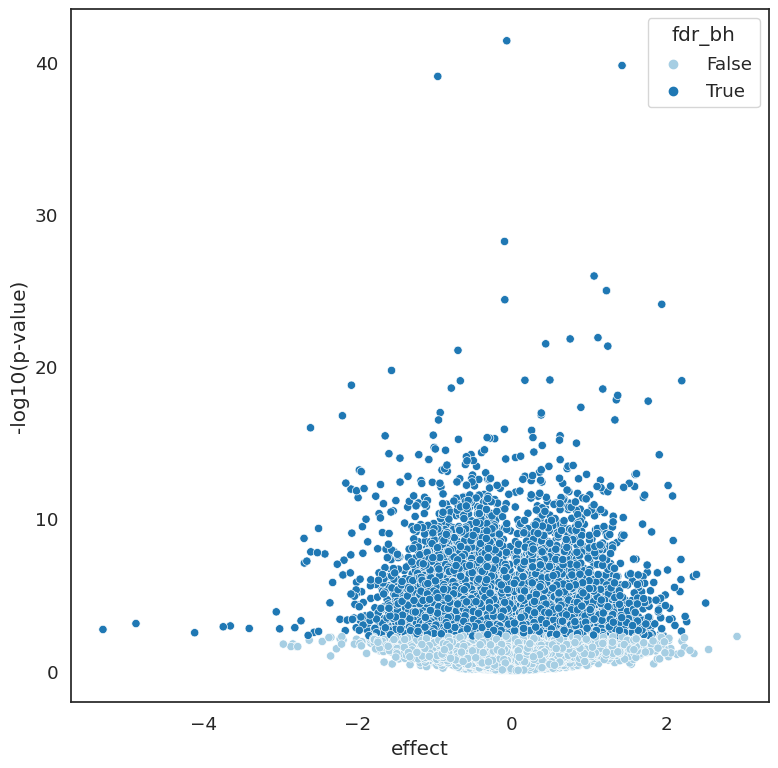

---- broad cell-type glmmTMB results ----
*** ExN glmmTMB results ***


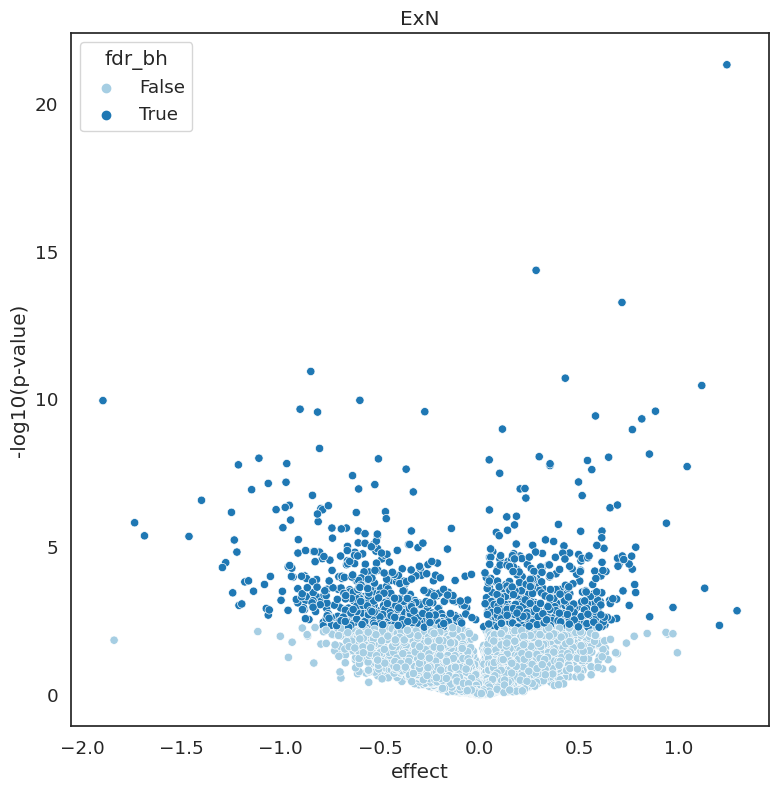

*** Oligodendrocyte glmmTMB results ***


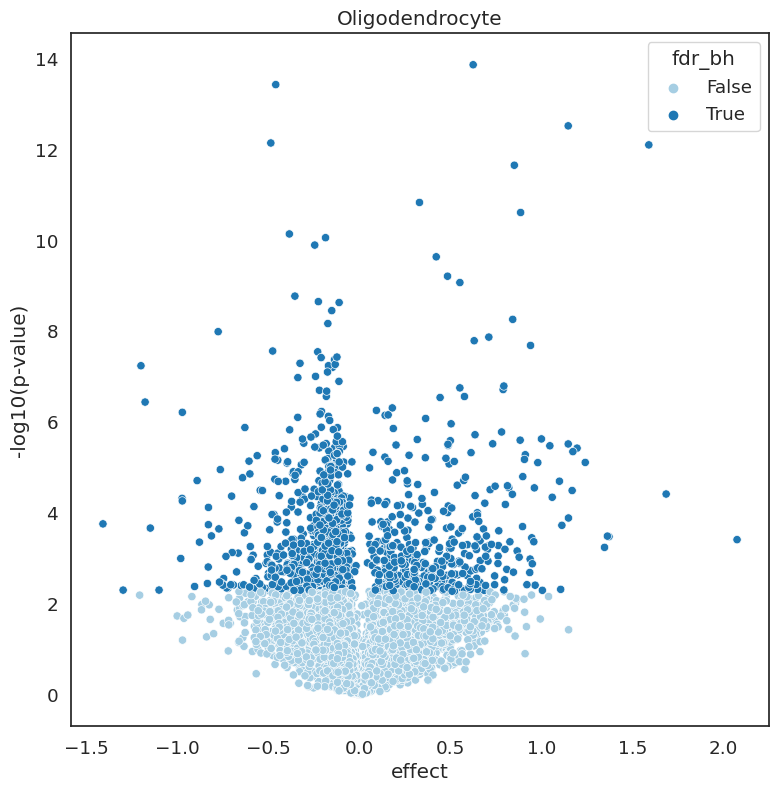

*** Astrocyte glmmTMB results ***


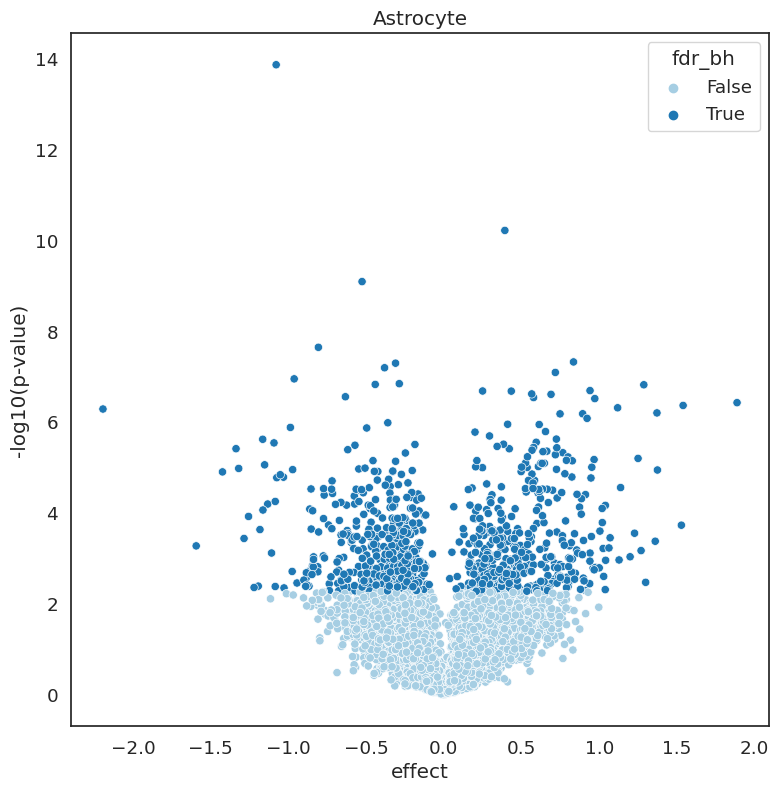

*** InN glmmTMB results ***


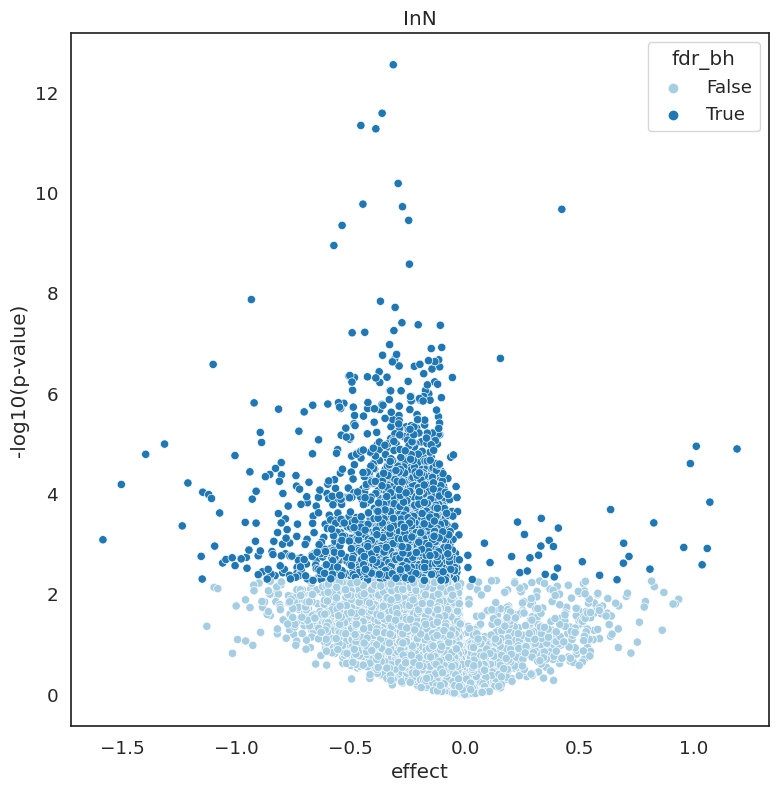

*** OPC glmmTMB results ***


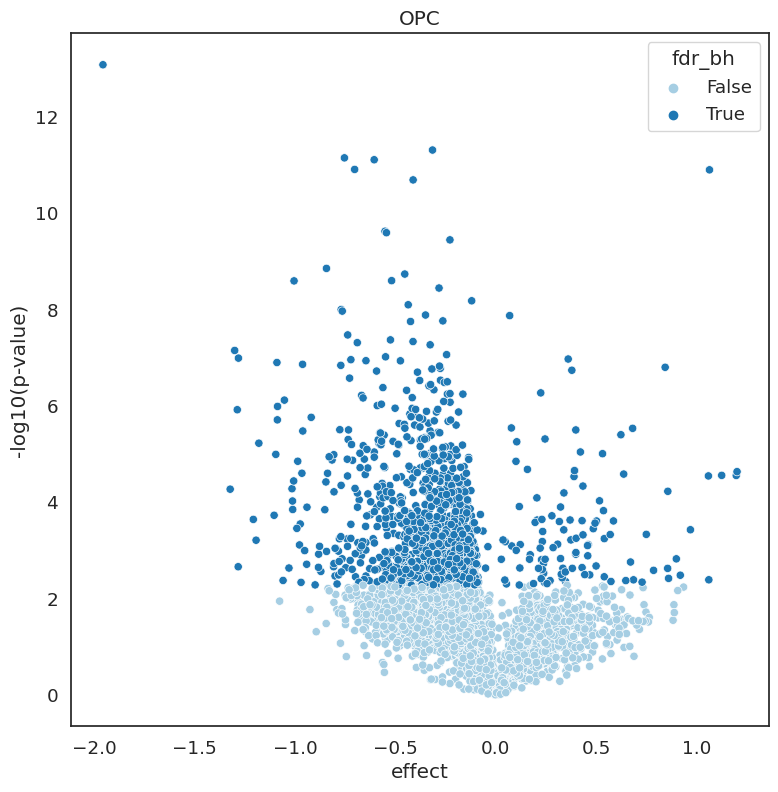

*** Mural glmmTMB results ***


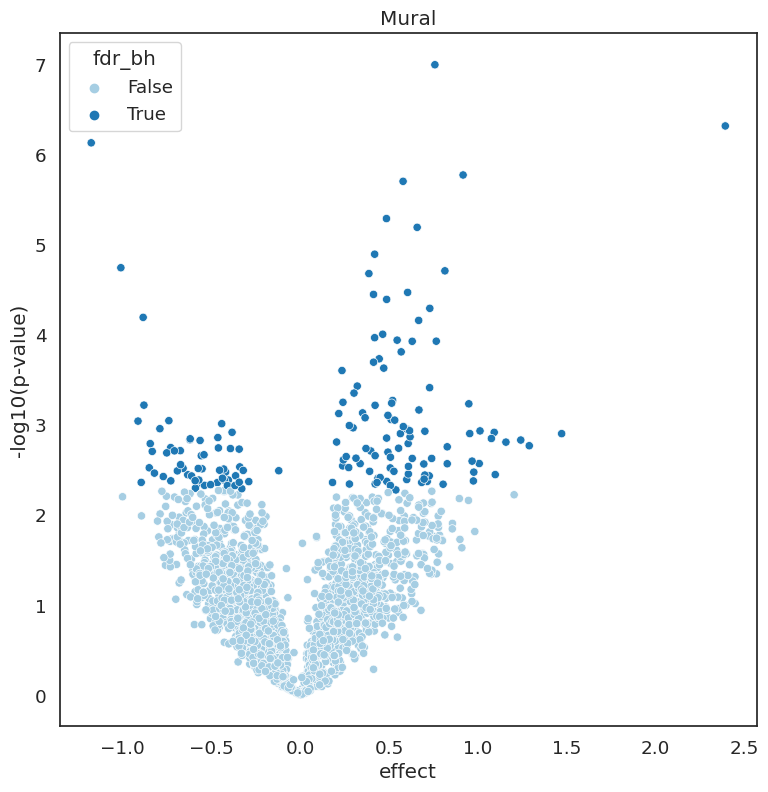

*** Microglia glmmTMB results ***


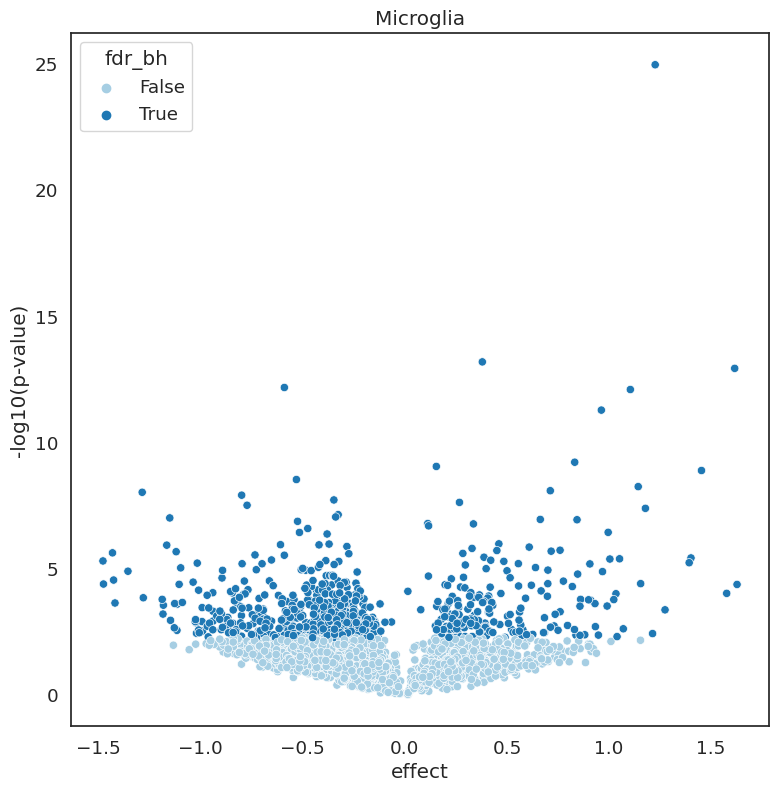

*** SPN glmmTMB results ***


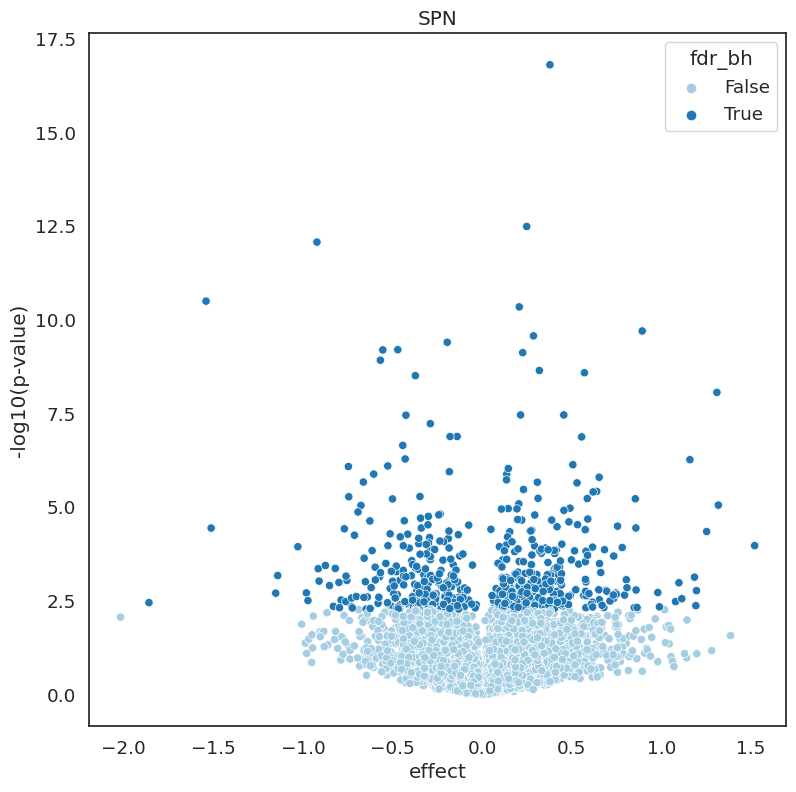

*** Endothelial glmmTMB results ***


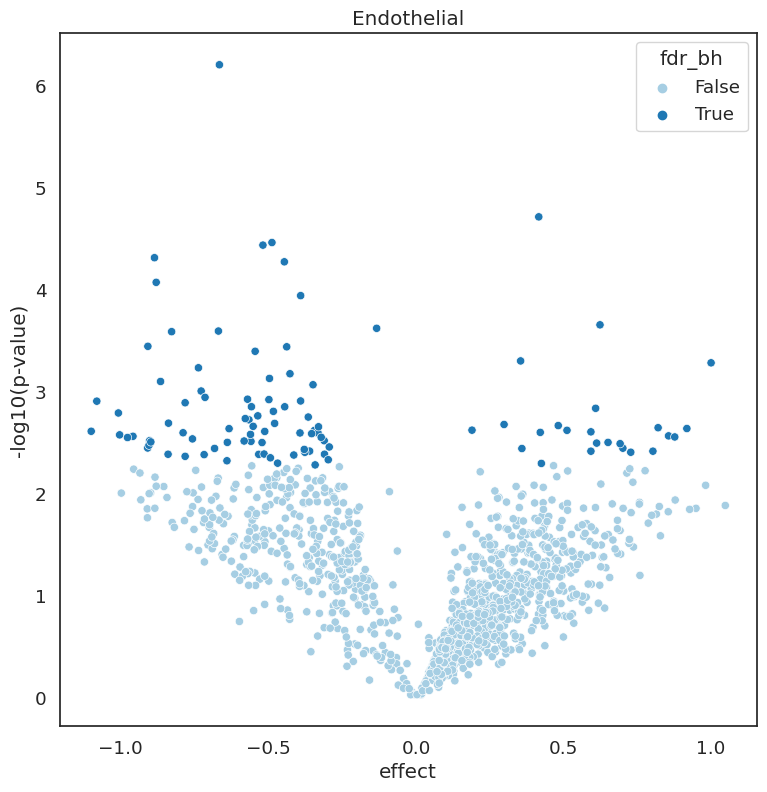

*** Ependymal glmmTMB results ***


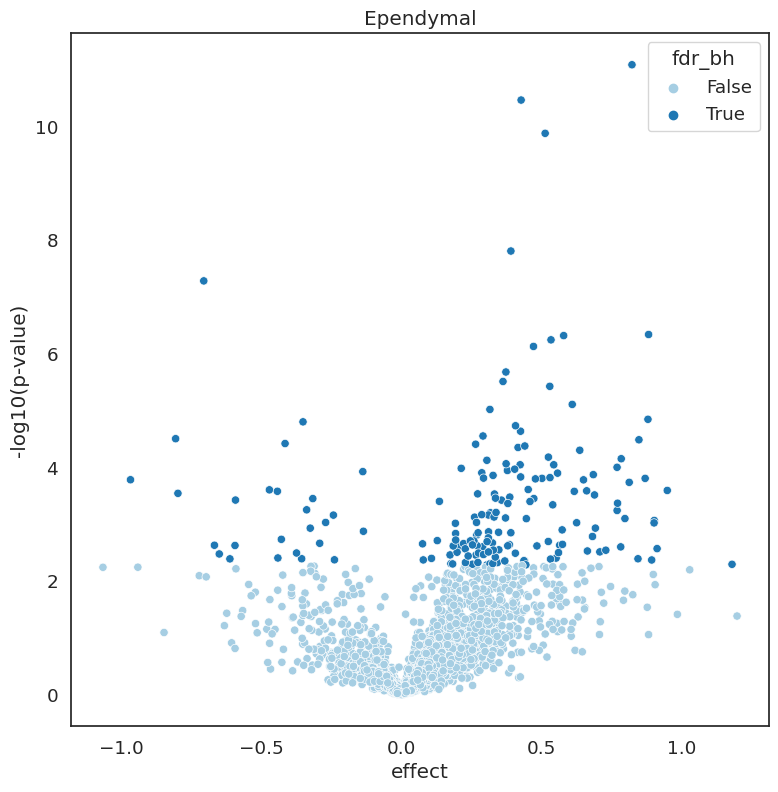

---- per region broad cell-type glmmTMB results ----
*** Middle temporal gyrus ExN glmmTMB results ***


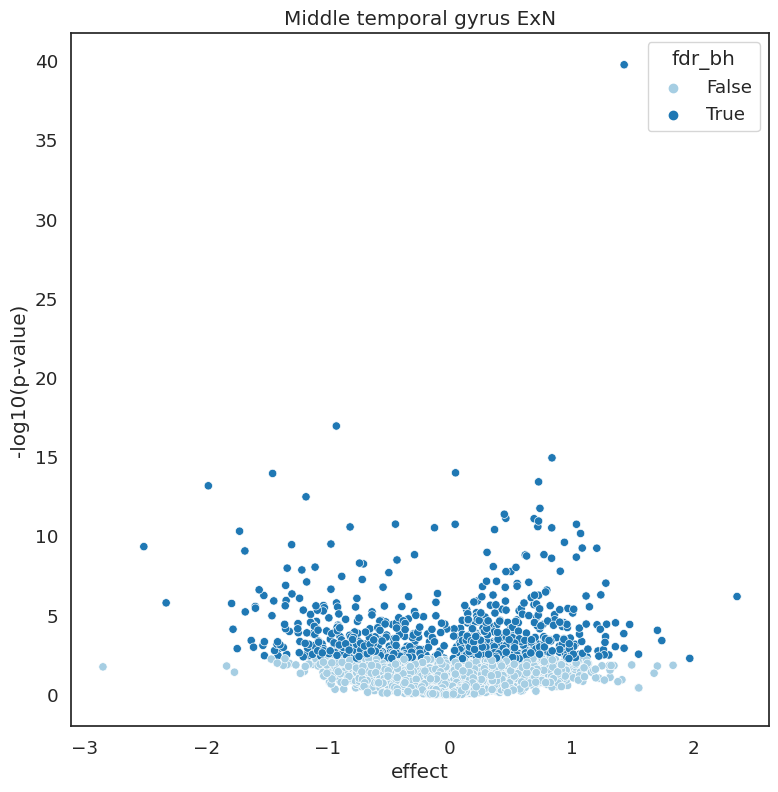

*** Middle temporal gyrus Oligodendrocyte glmmTMB results ***


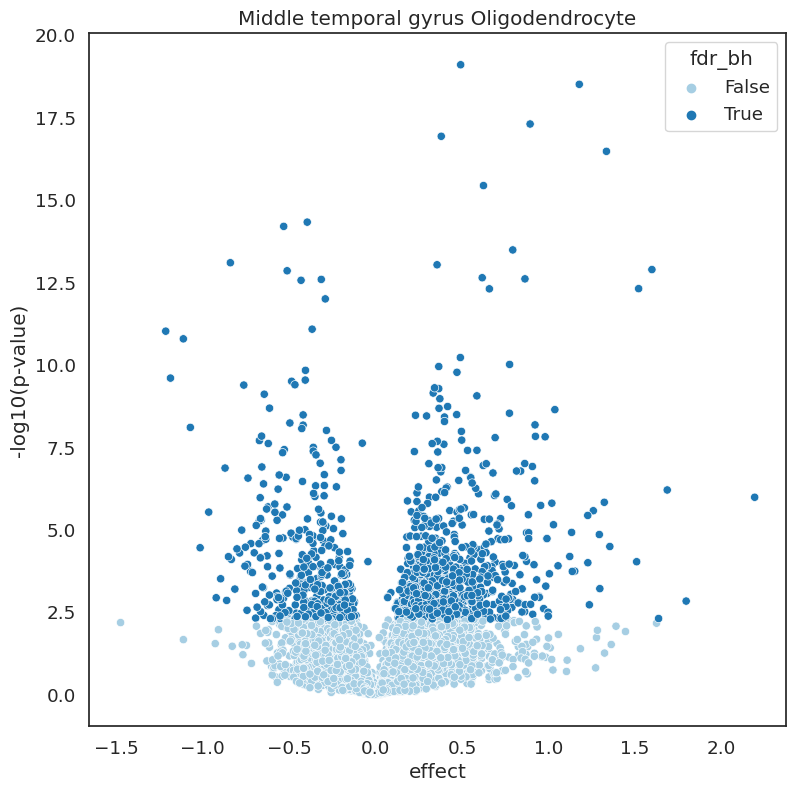

*** Middle temporal gyrus Astrocyte glmmTMB results ***


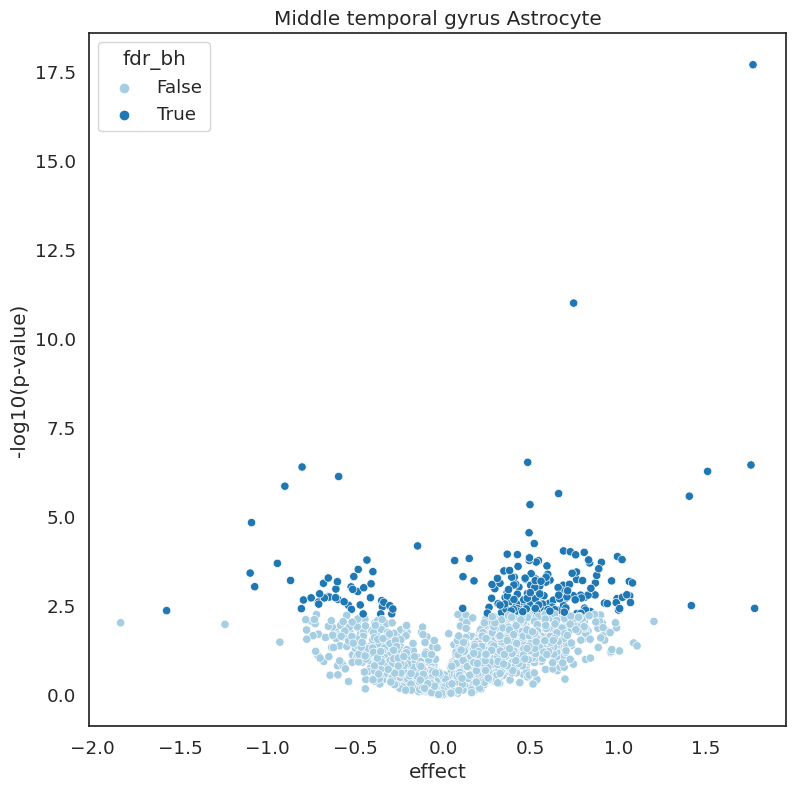

*** Middle temporal gyrus InN glmmTMB results ***


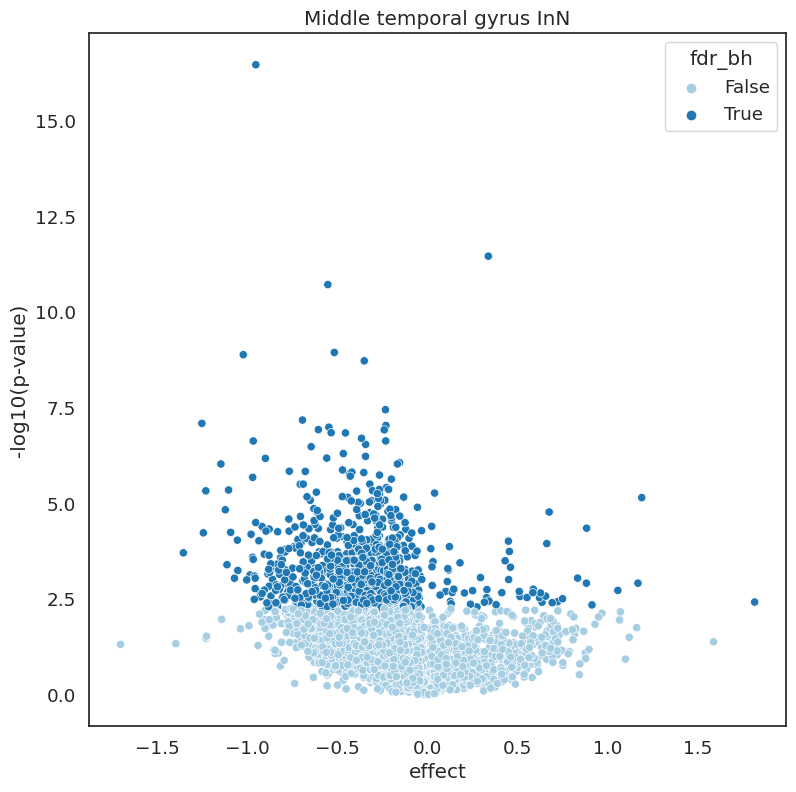

*** Middle temporal gyrus OPC glmmTMB results ***


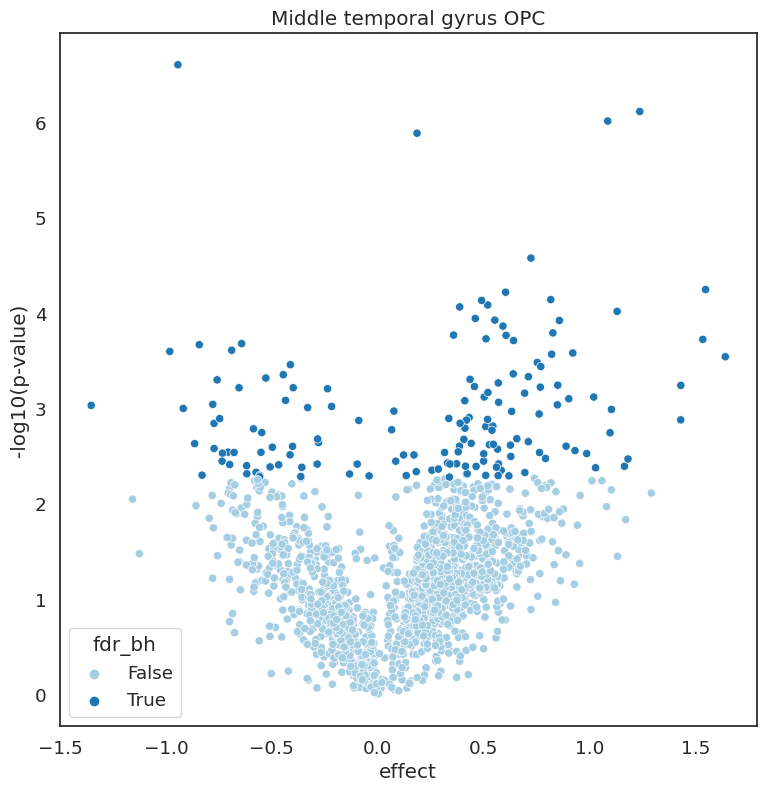

*** Middle temporal gyrus Mural glmmTMB results ***


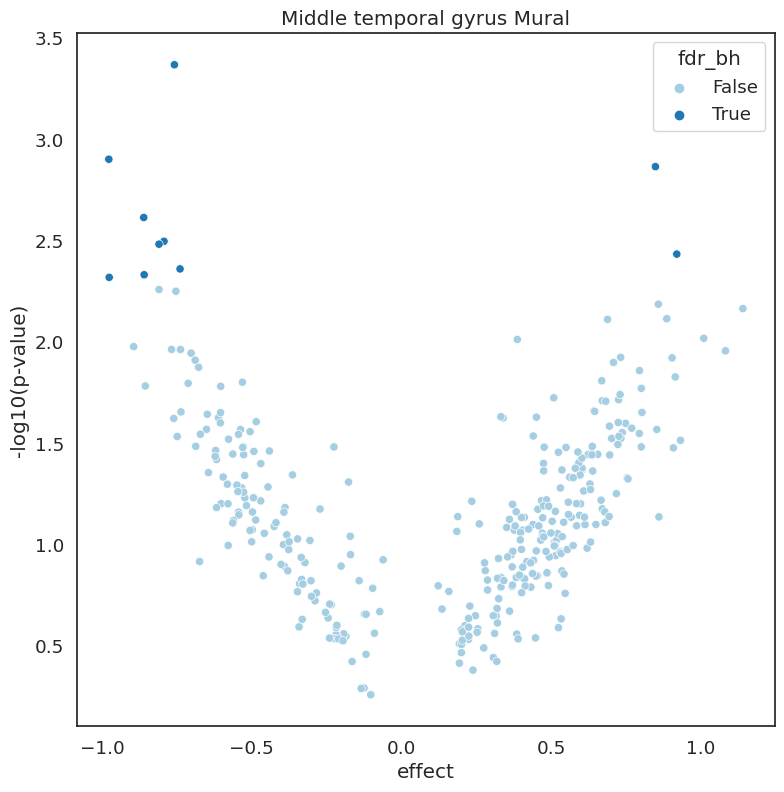

*** Middle temporal gyrus Microglia glmmTMB results ***


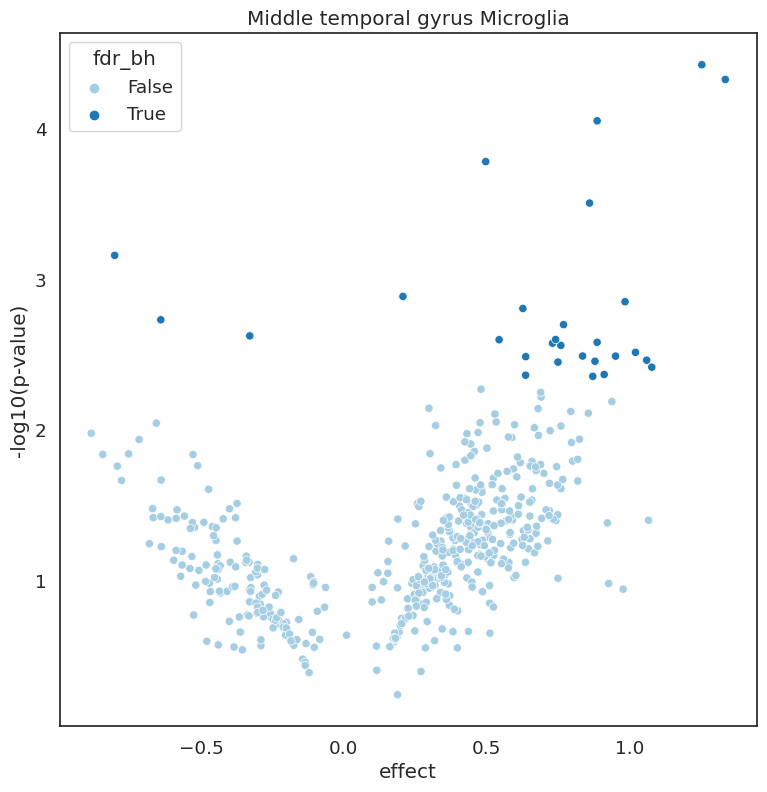

*** Middle temporal gyrus SPN glmmTMB results ***


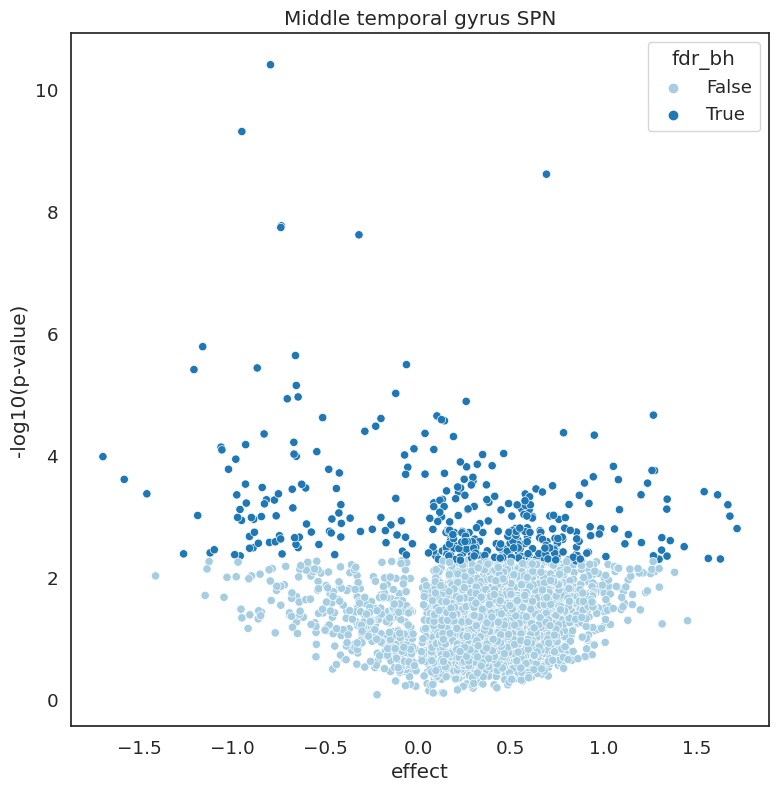

*** Middle temporal gyrus Endothelial glmmTMB results ***


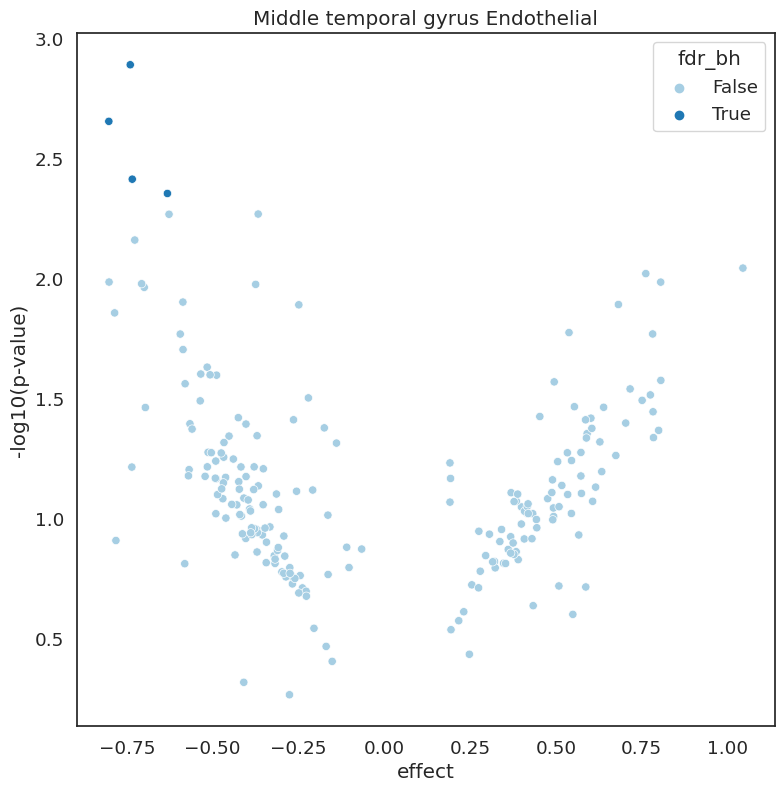

*** Putamen Oligodendrocyte glmmTMB results ***


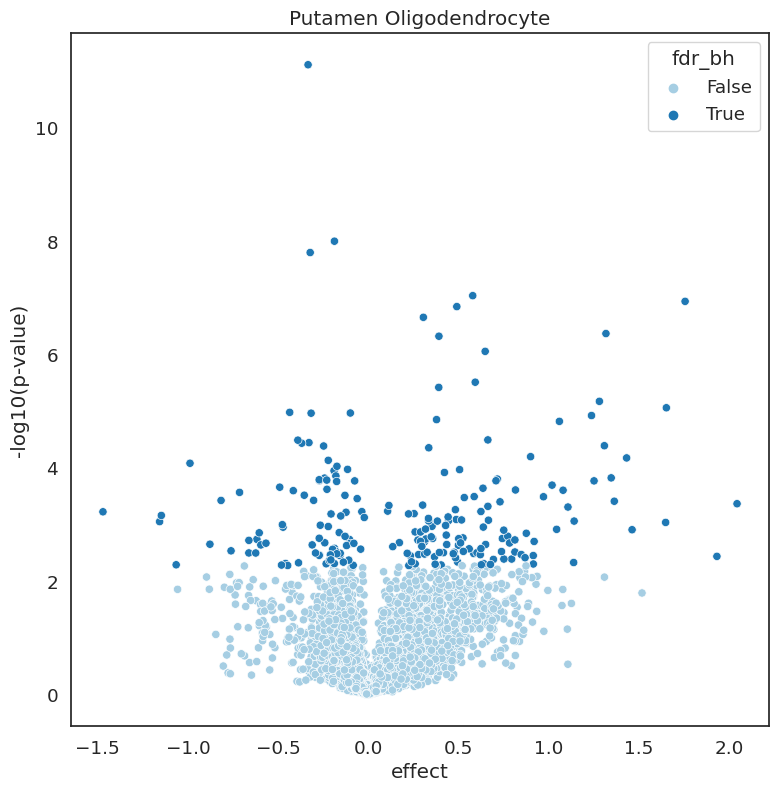

*** Putamen Astrocyte glmmTMB results ***


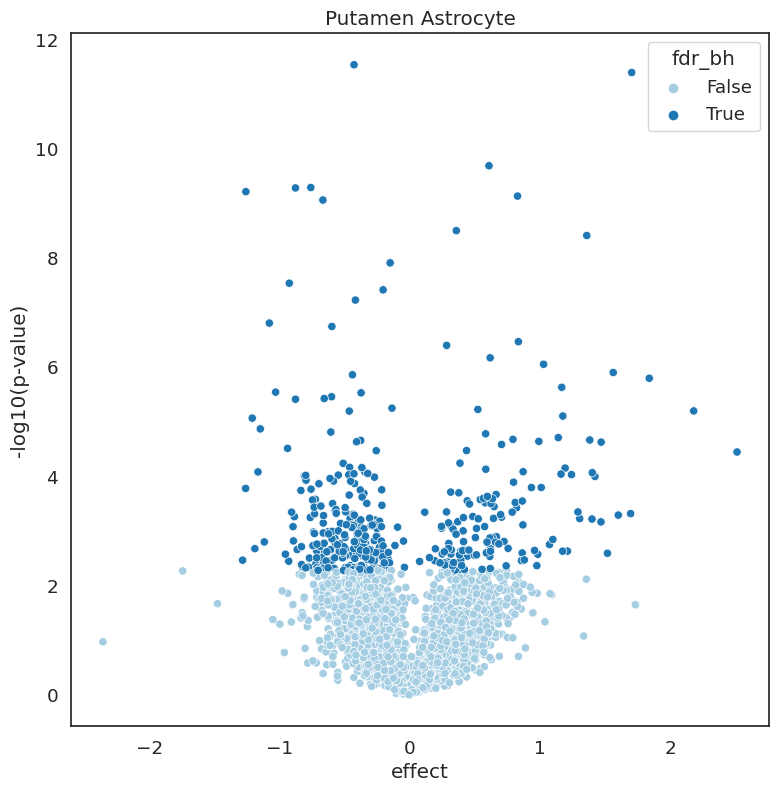

*** Putamen InN glmmTMB results ***


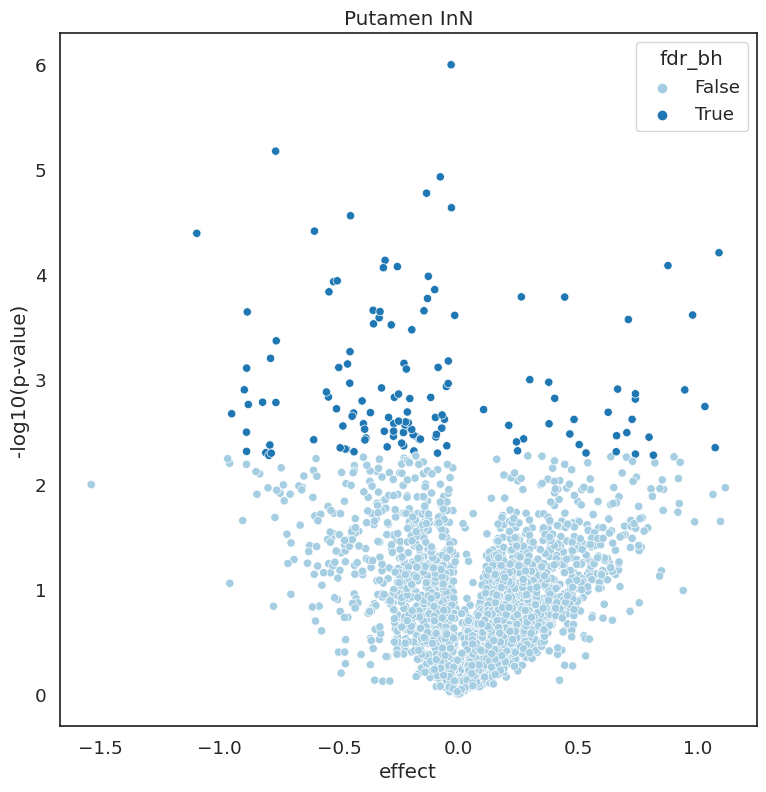

*** Putamen OPC glmmTMB results ***


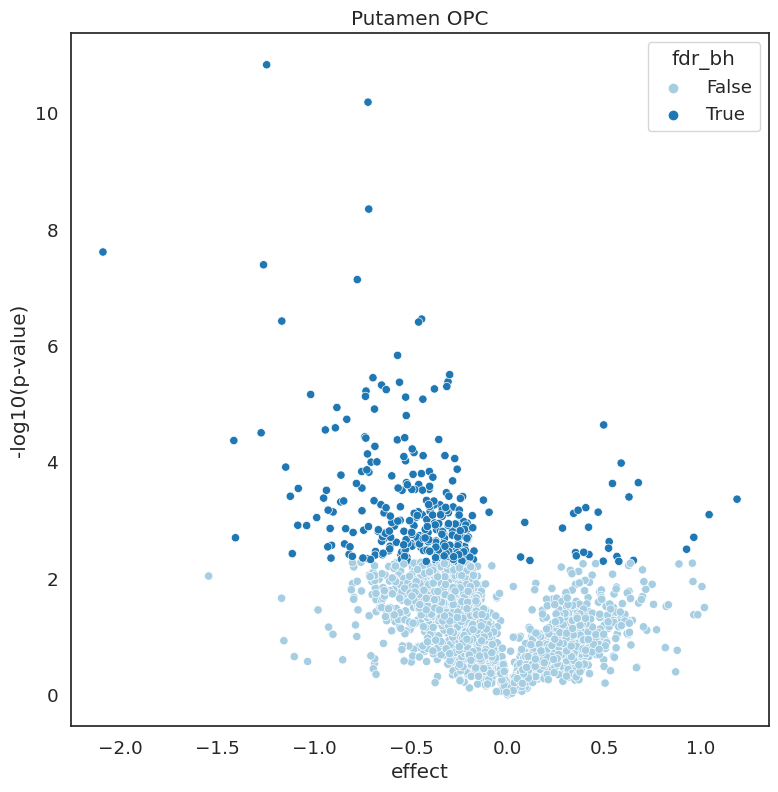

*** Putamen Mural glmmTMB results ***


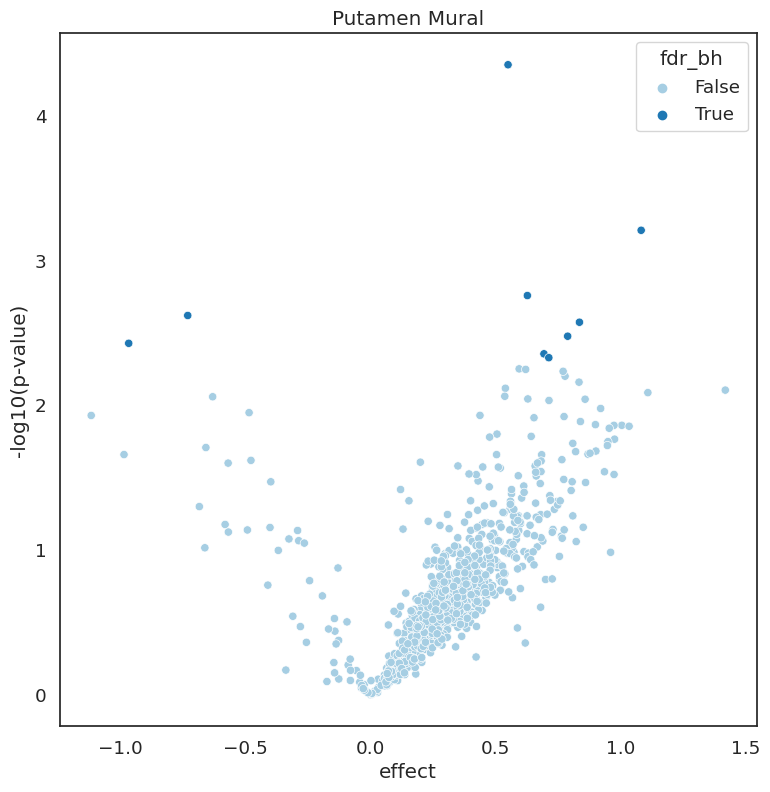

*** Putamen Microglia glmmTMB results ***


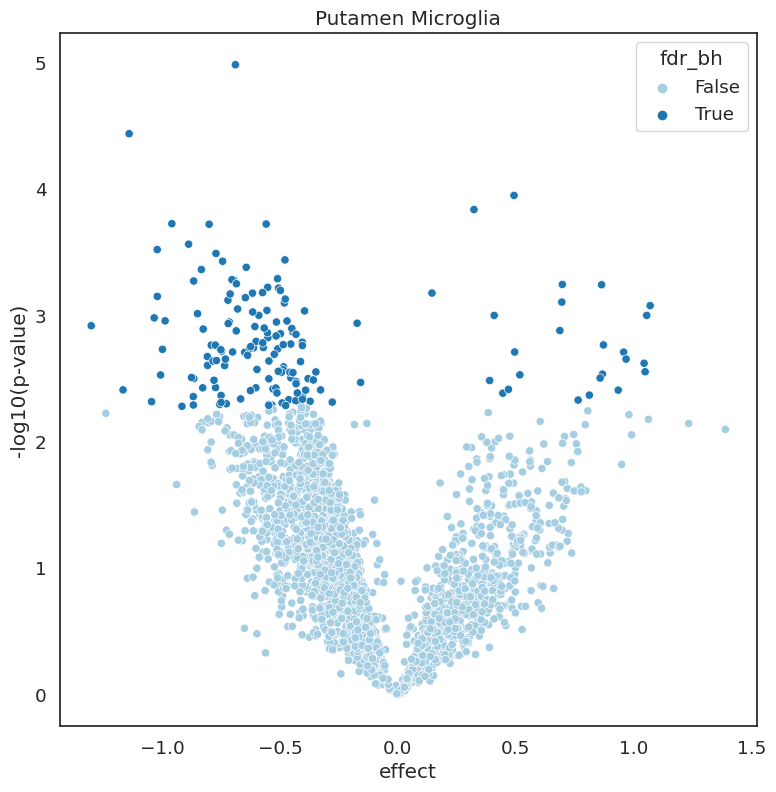

*** Putamen SPN glmmTMB results ***


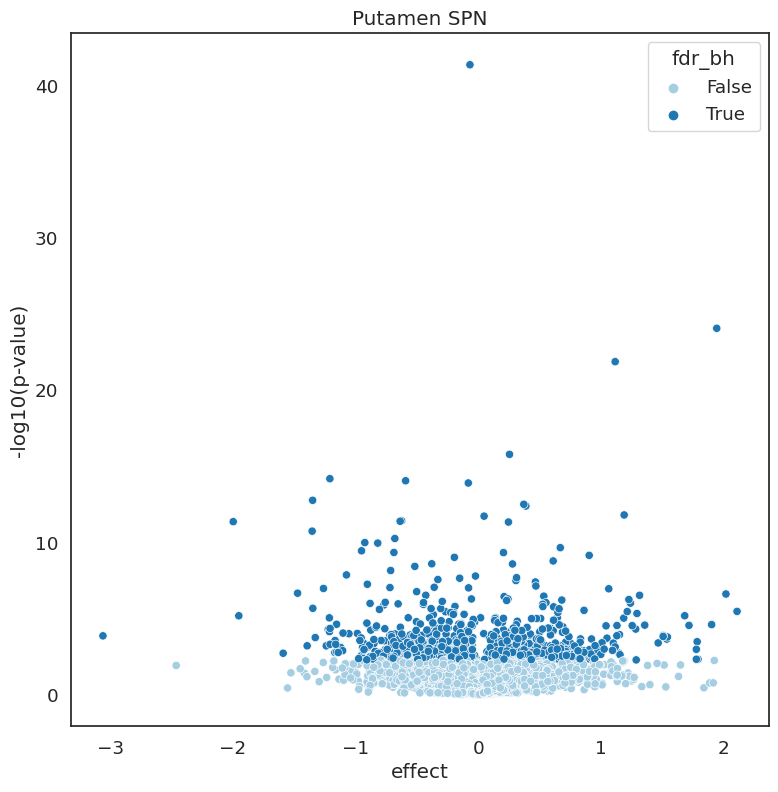

*** Putamen Endothelial glmmTMB results ***


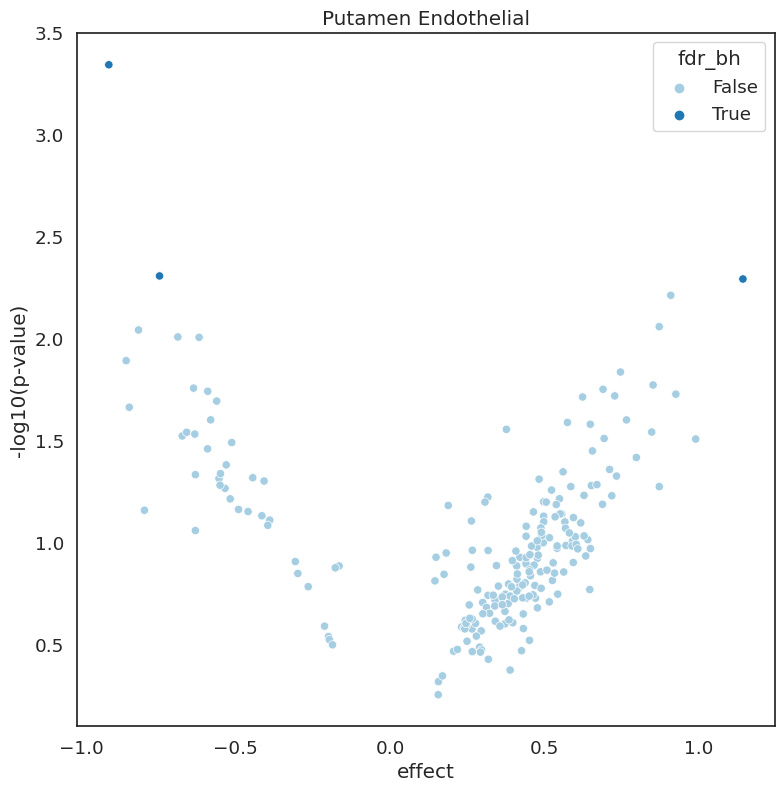

*** Entorhinal cortex ExN glmmTMB results ***


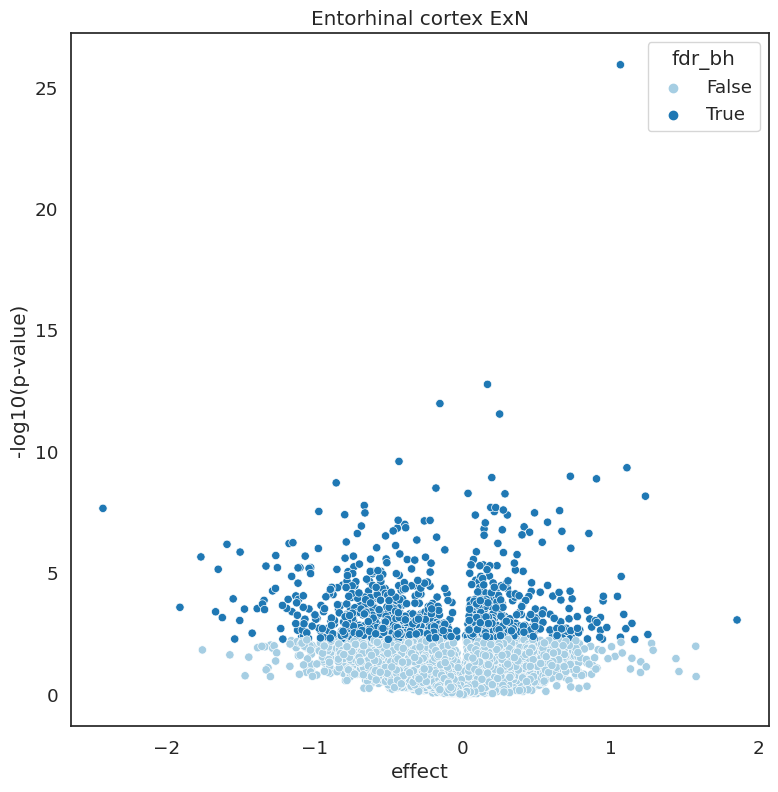

*** Entorhinal cortex Oligodendrocyte glmmTMB results ***


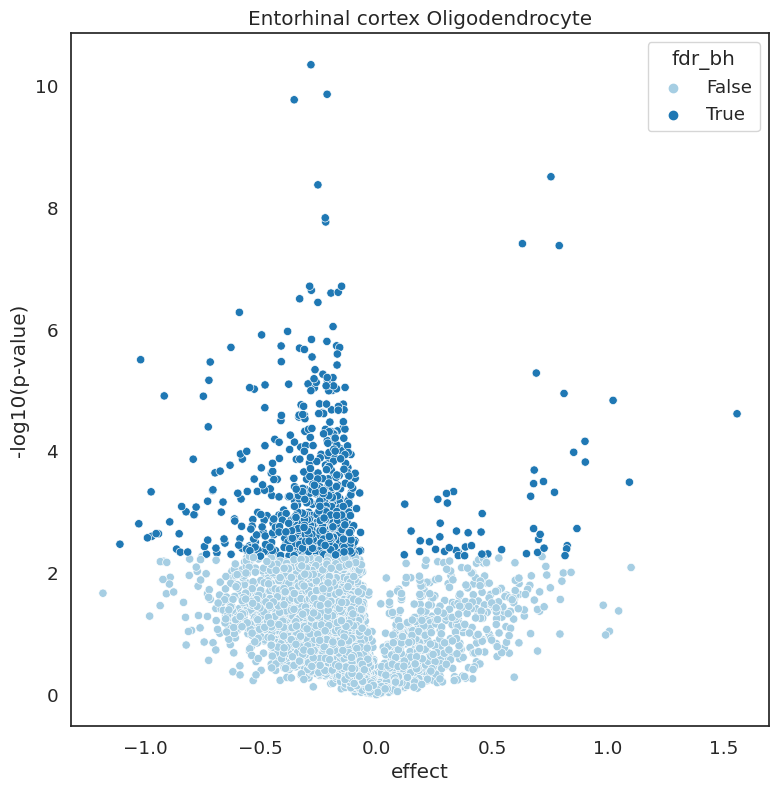

*** Entorhinal cortex Astrocyte glmmTMB results ***


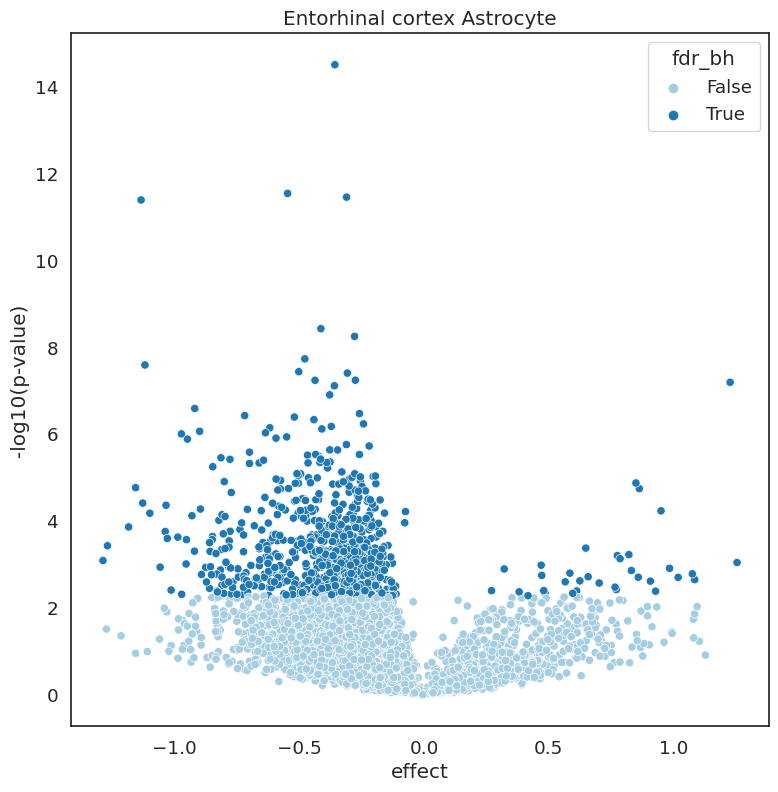

*** Entorhinal cortex InN glmmTMB results ***


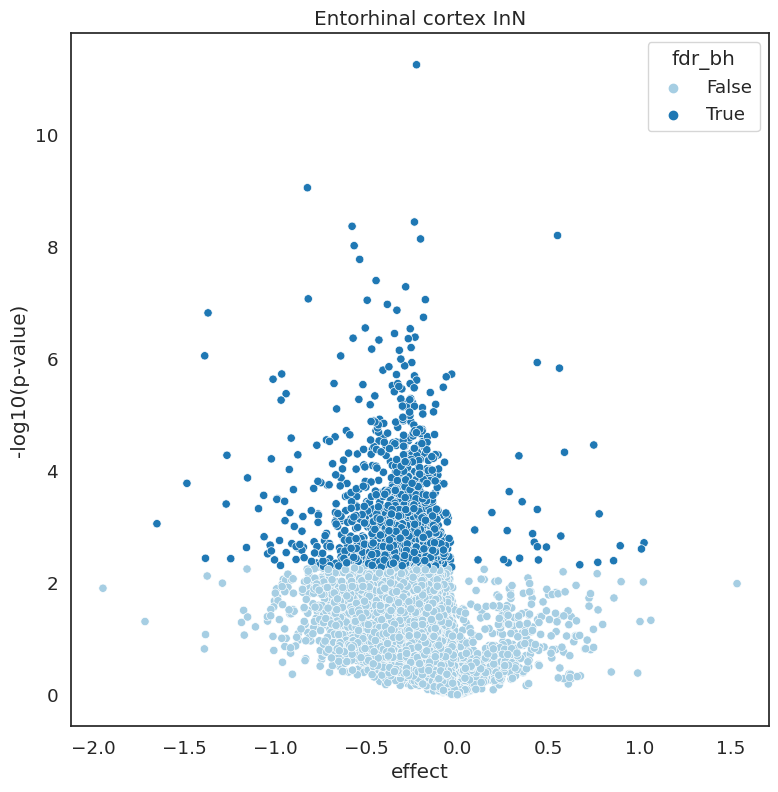

*** Entorhinal cortex OPC glmmTMB results ***


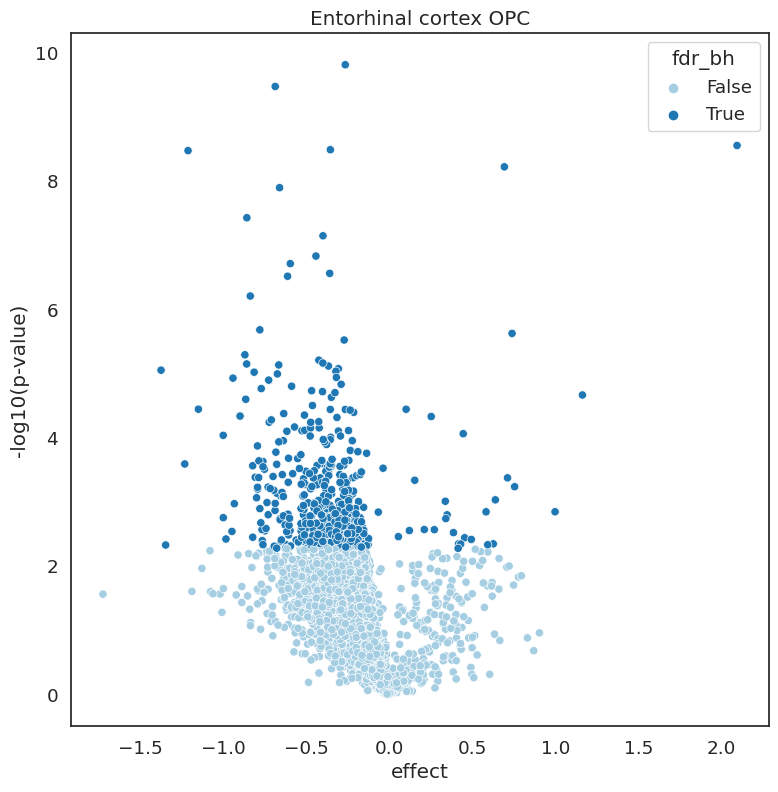

*** Entorhinal cortex Mural glmmTMB results ***


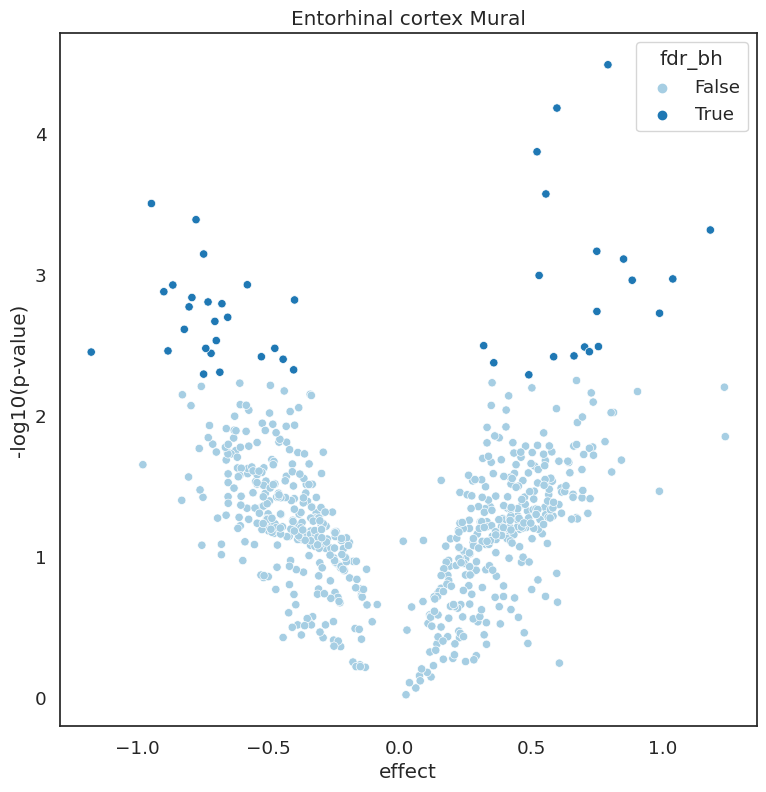

*** Entorhinal cortex Microglia glmmTMB results ***


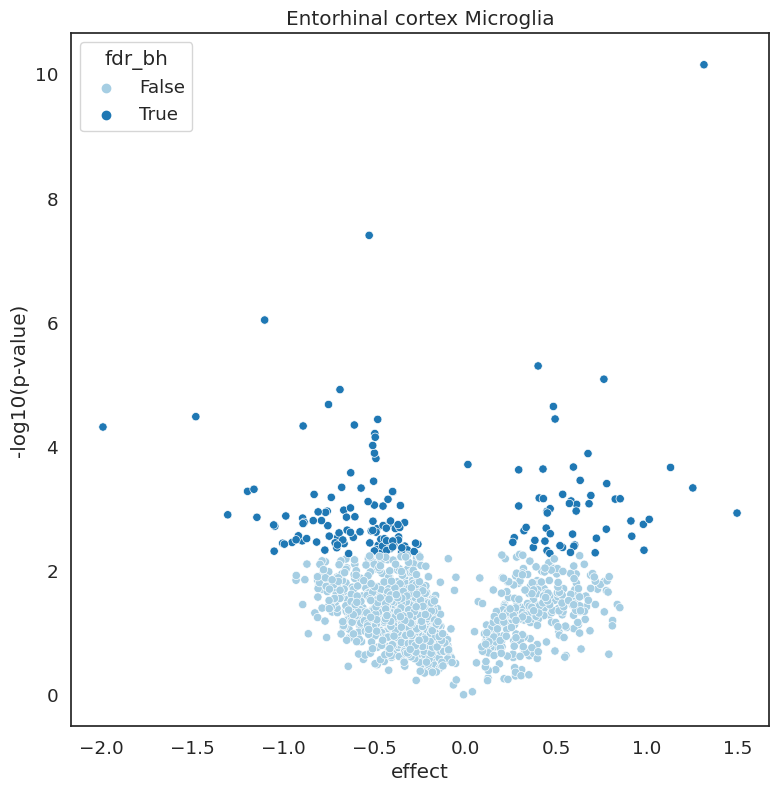

*** Entorhinal cortex SPN glmmTMB results ***


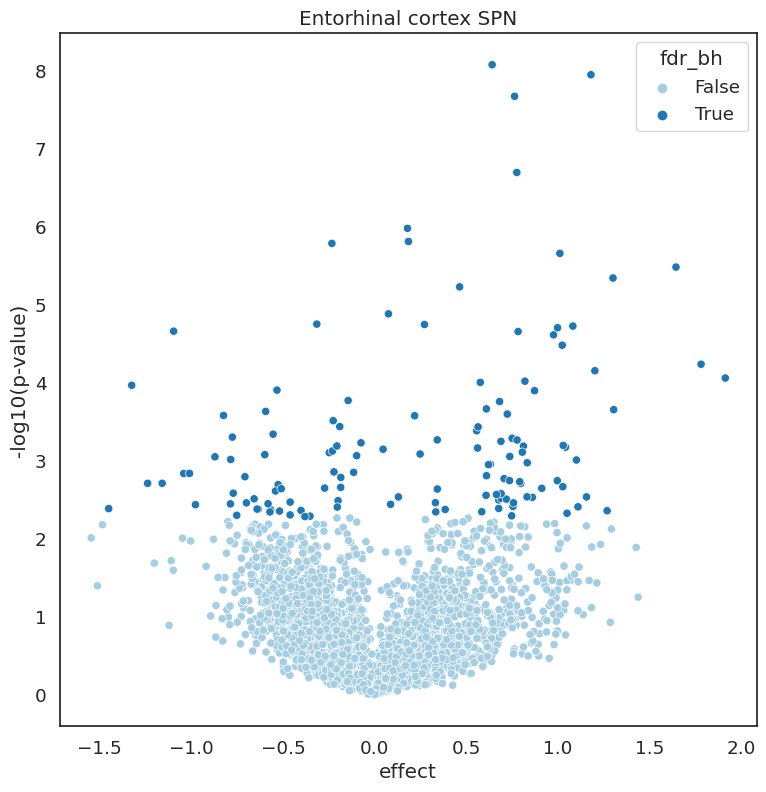

*** Entorhinal cortex Endothelial glmmTMB results ***


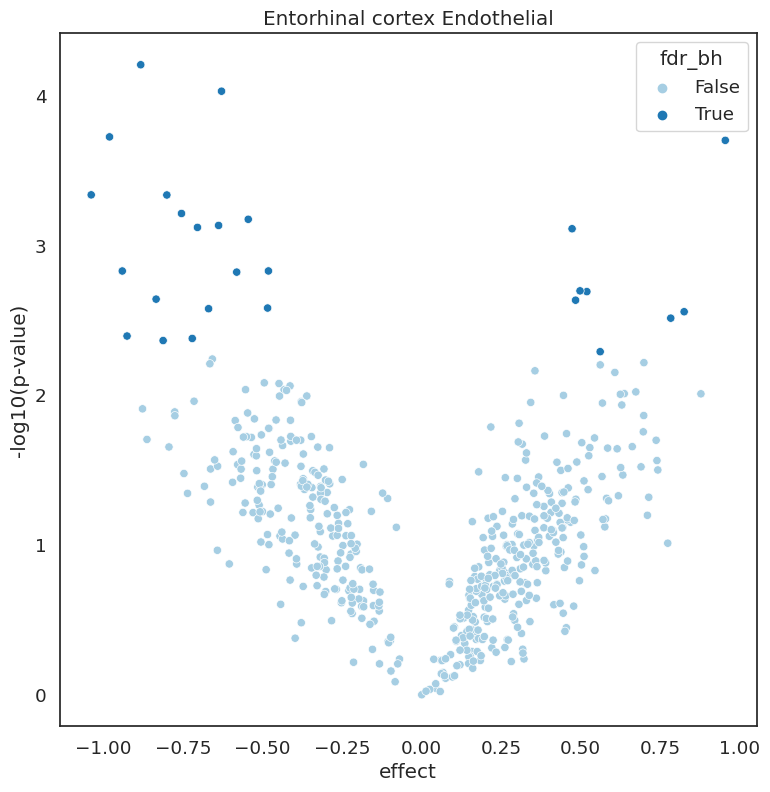

*** Entorhinal cortex Ependymal glmmTMB results ***


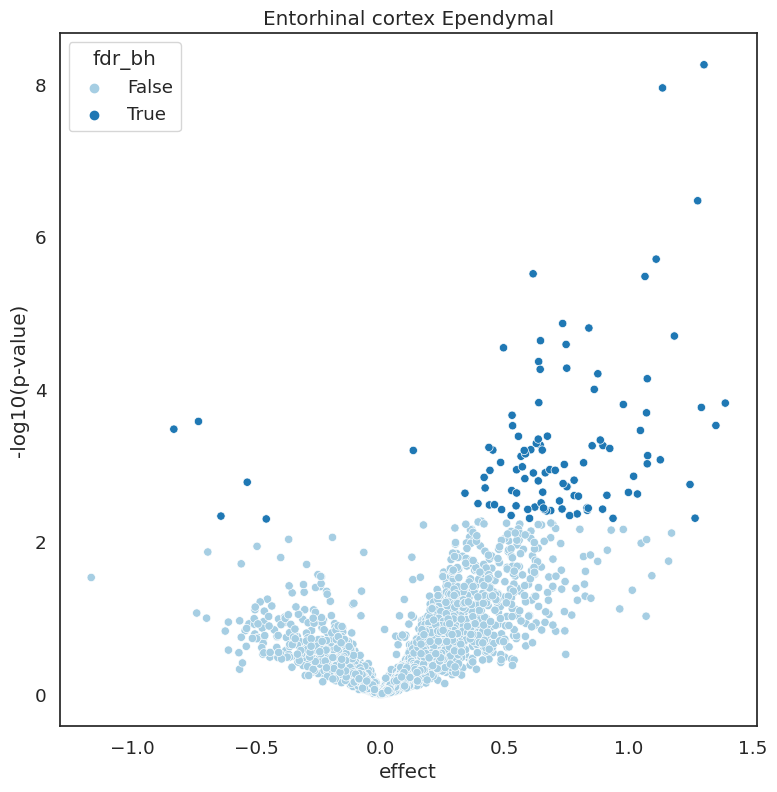

*** Subventricular zone ExN glmmTMB results ***


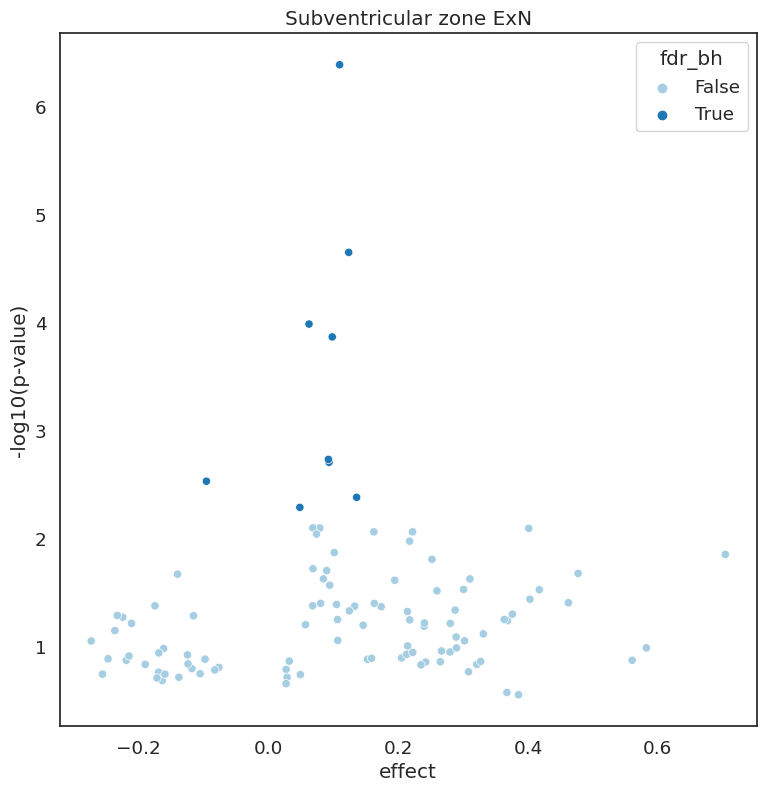

*** Subventricular zone Oligodendrocyte glmmTMB results ***


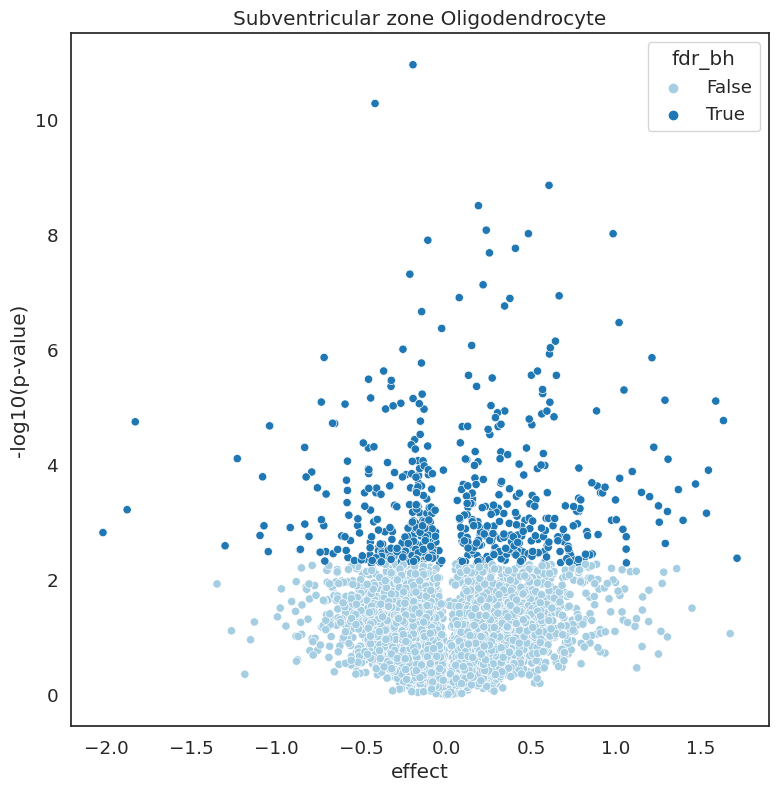

*** Subventricular zone Astrocyte glmmTMB results ***


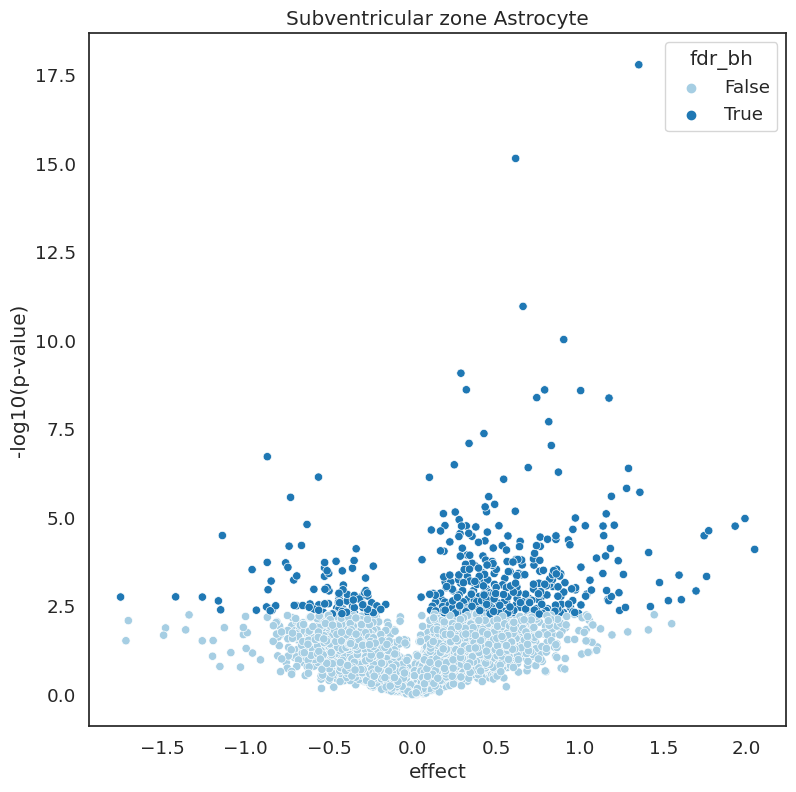

*** Subventricular zone InN glmmTMB results ***


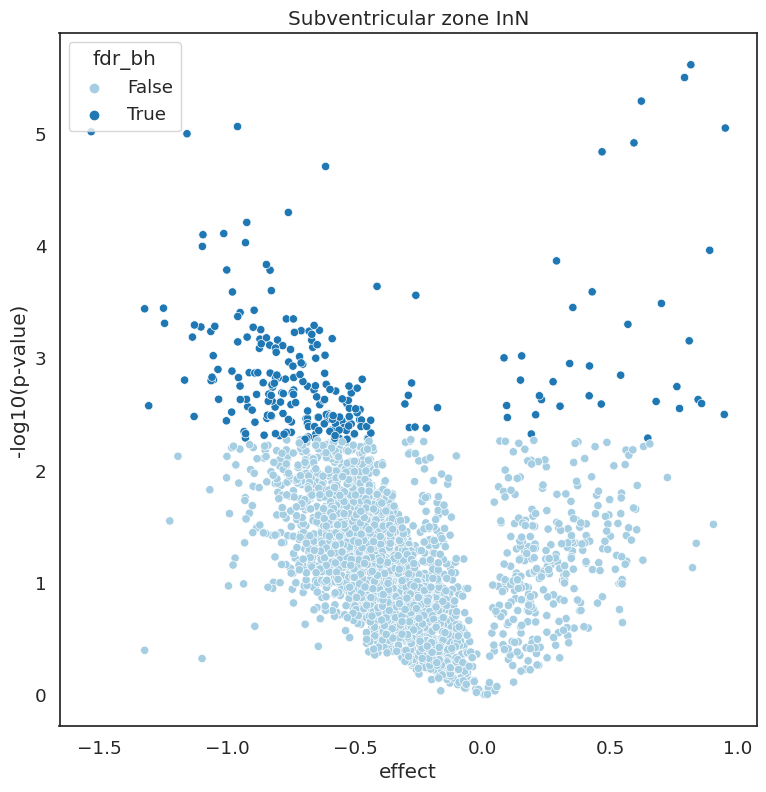

*** Subventricular zone OPC glmmTMB results ***


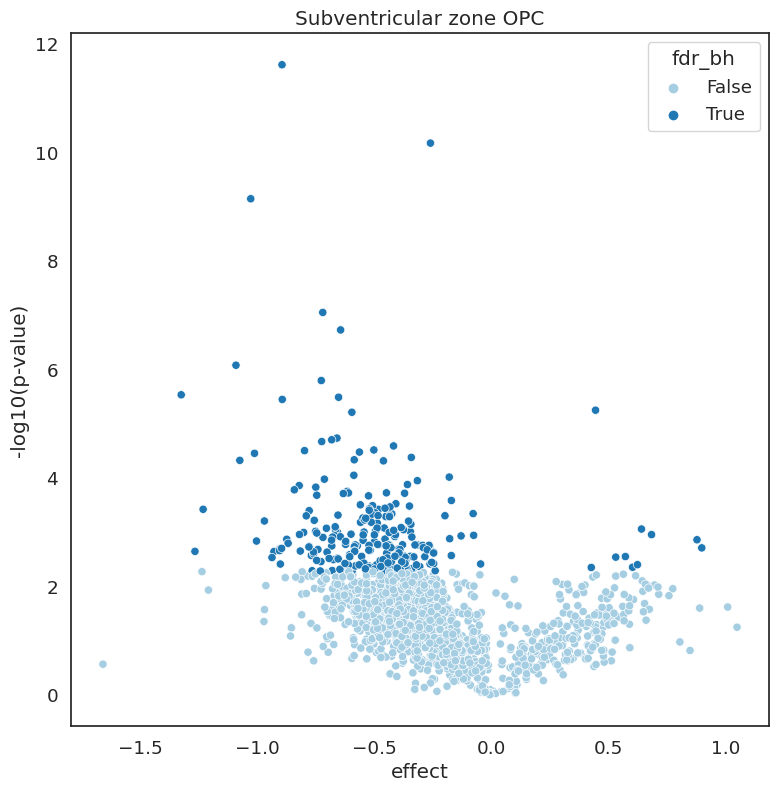

*** Subventricular zone Mural glmmTMB results ***


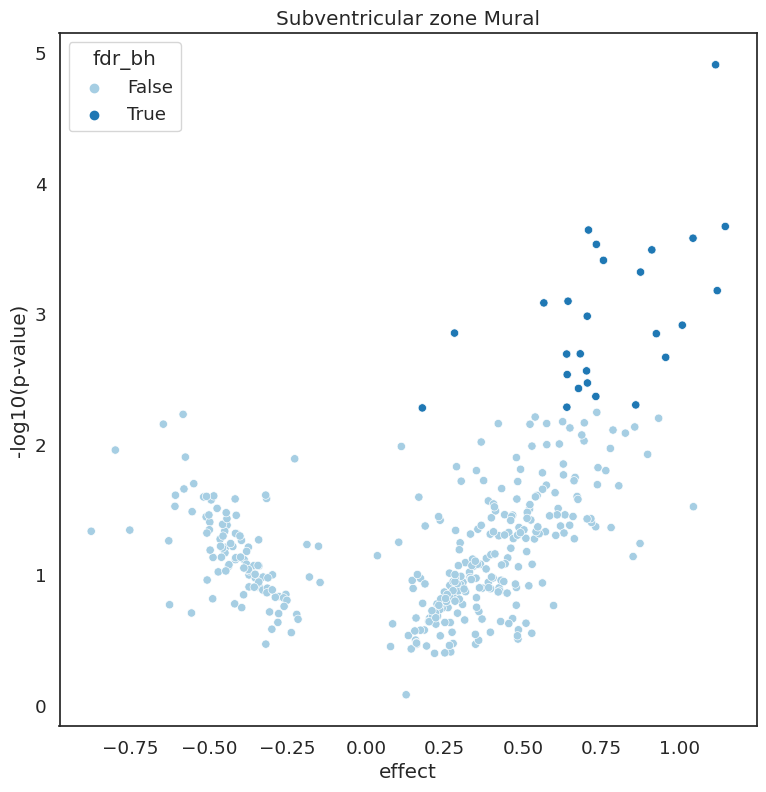

*** Subventricular zone Microglia glmmTMB results ***


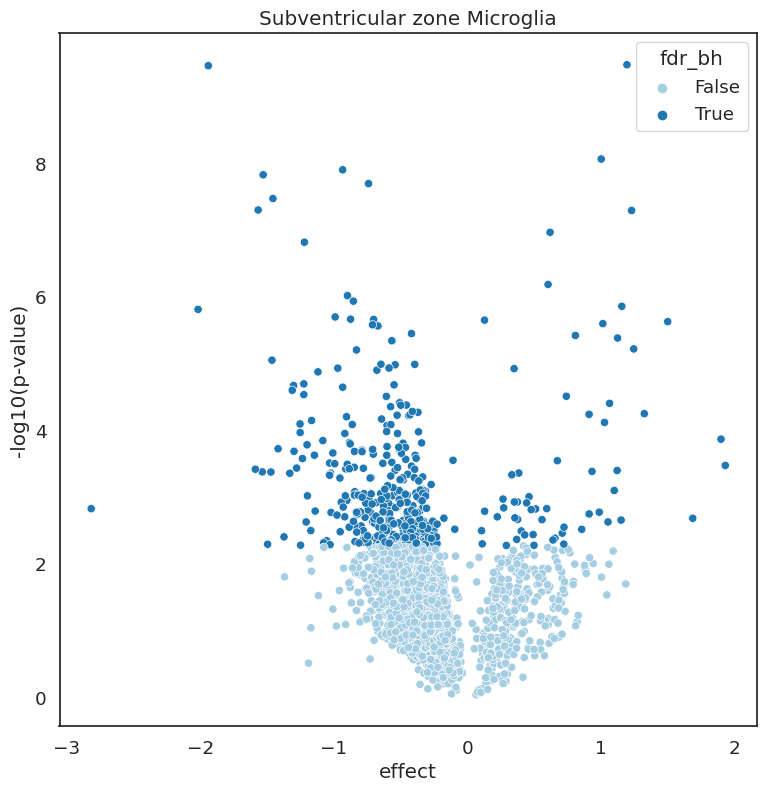

*** Subventricular zone SPN glmmTMB results ***


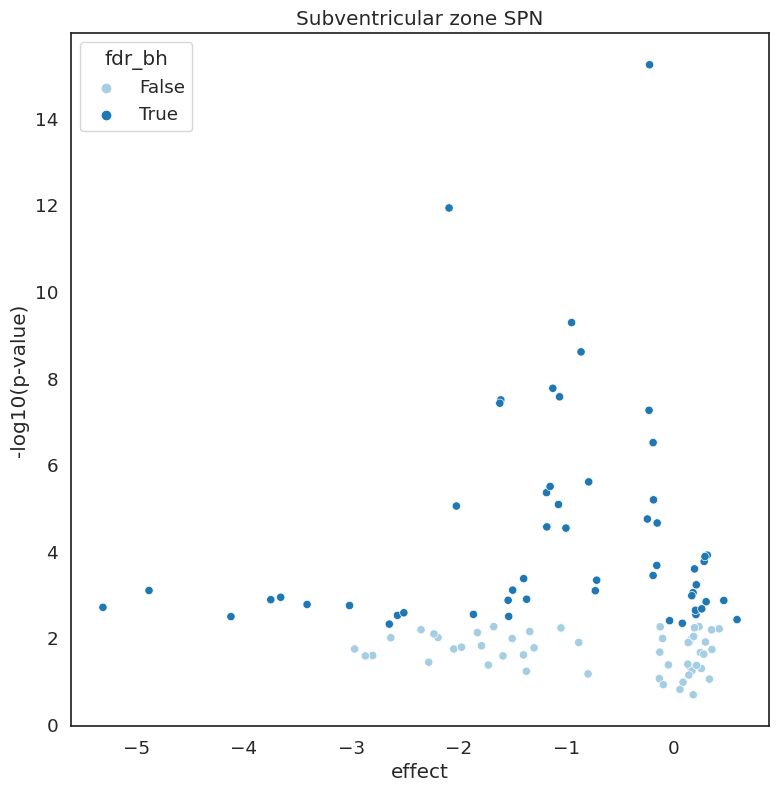

*** Subventricular zone Endothelial glmmTMB results ***


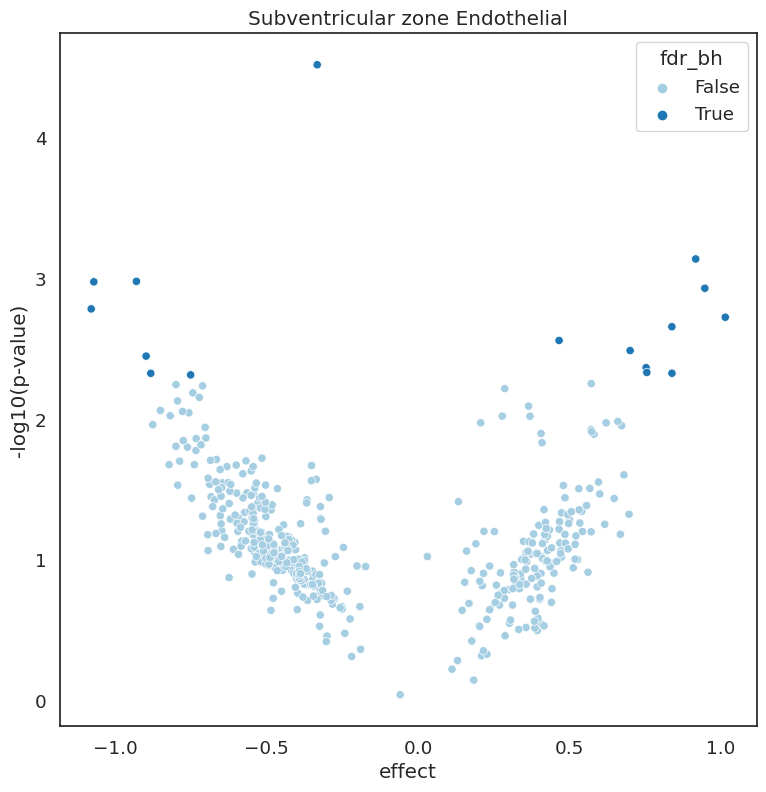

*** Subventricular zone Ependymal glmmTMB results ***


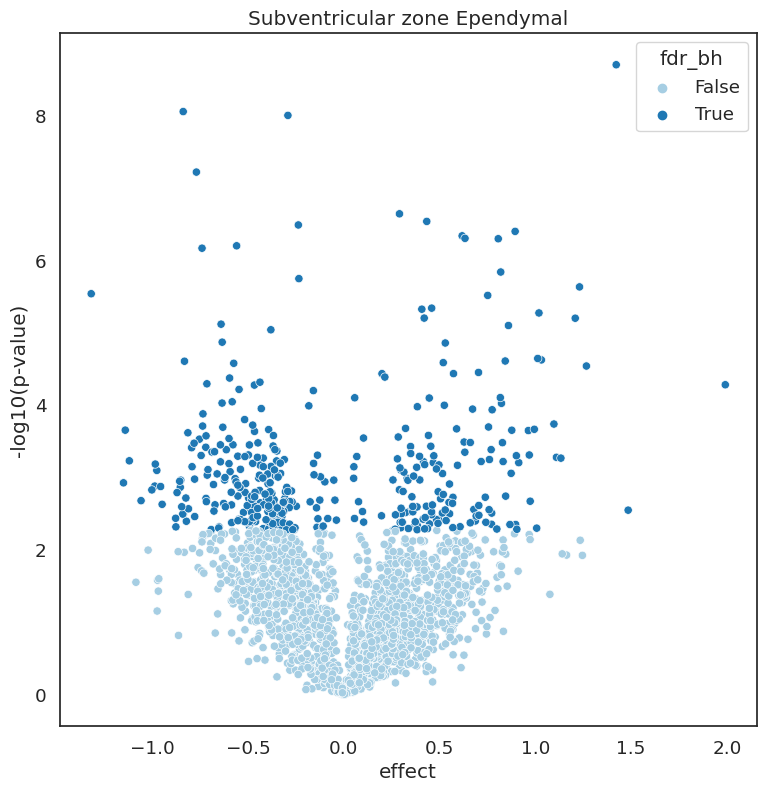

---- specific cell-types glmmTMB results ----
*** ExN CUX2 LAMP5 glmmTMB results ***


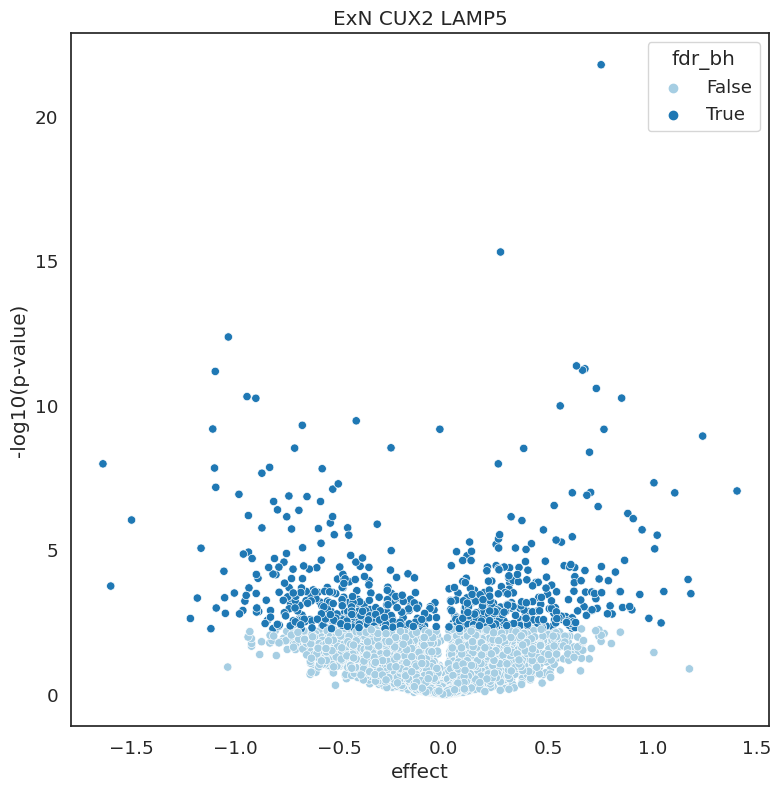

*** Oligodendrocyte-1 glmmTMB results ***


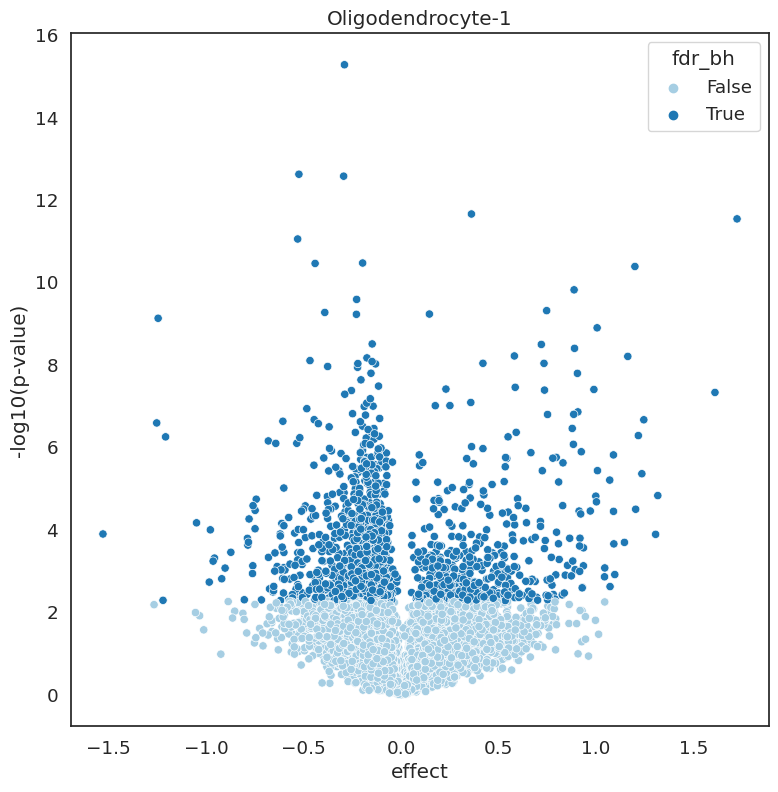

*** Astrocyte glmmTMB results ***


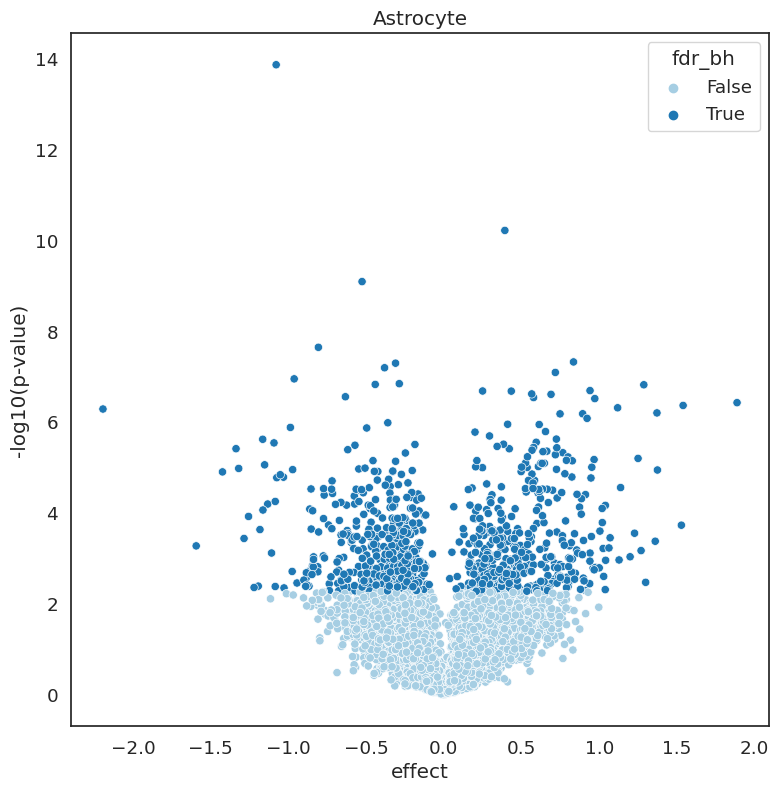

*** ExN RORB glmmTMB results ***


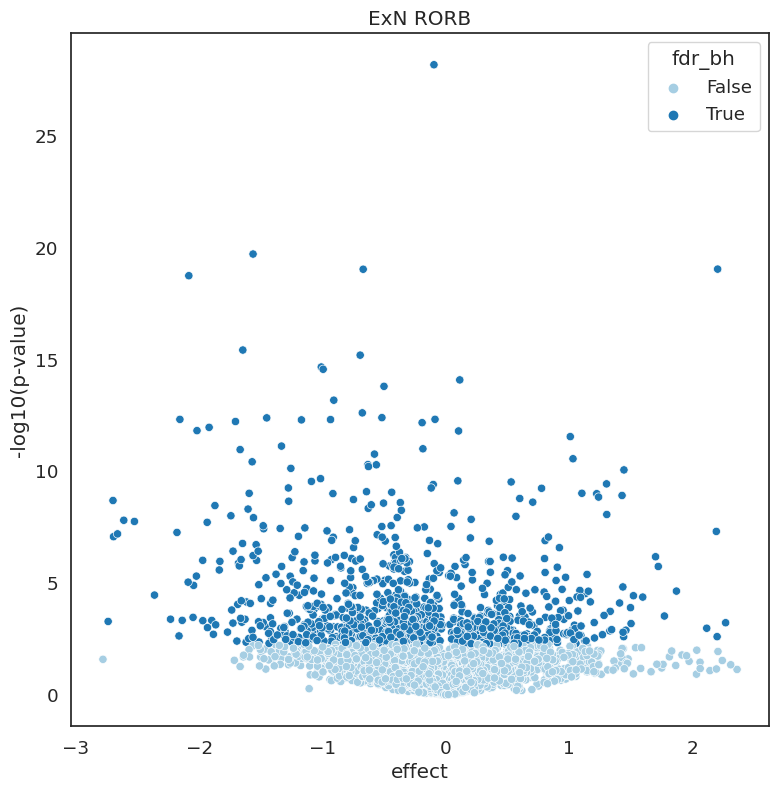

*** ExN RORB THEMIS glmmTMB results ***


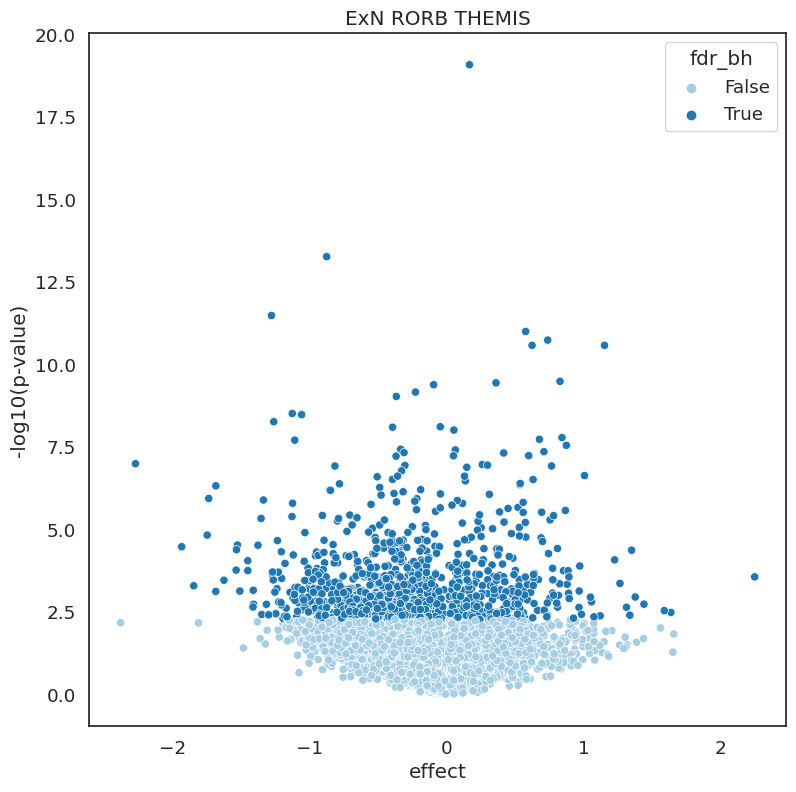

*** InN ADARB2 LAMP5 glmmTMB results ***


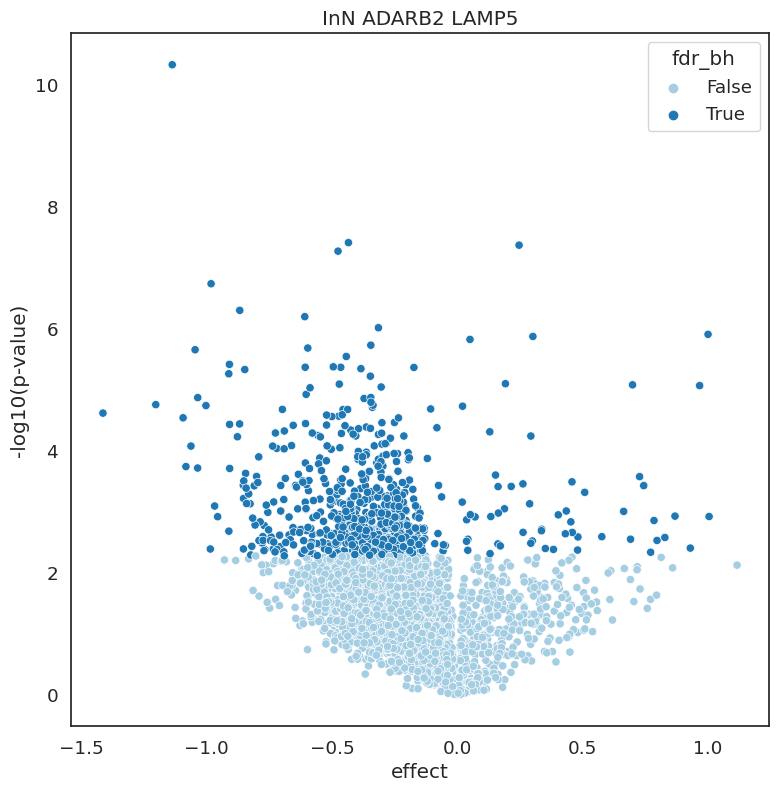

*** InN LHX6 SST glmmTMB results ***


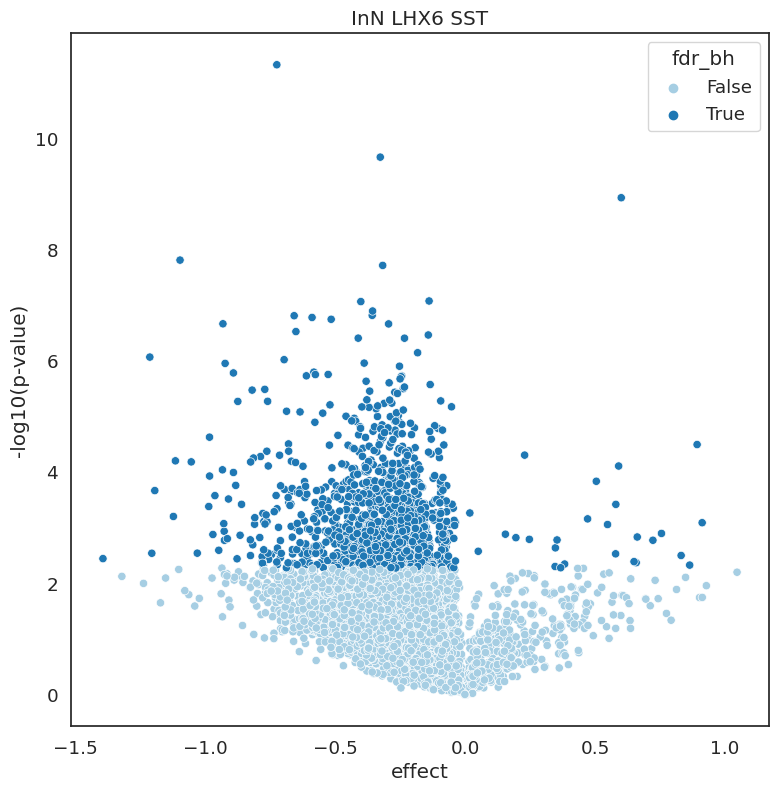

*** Oligodendrocyte-2 glmmTMB results ***


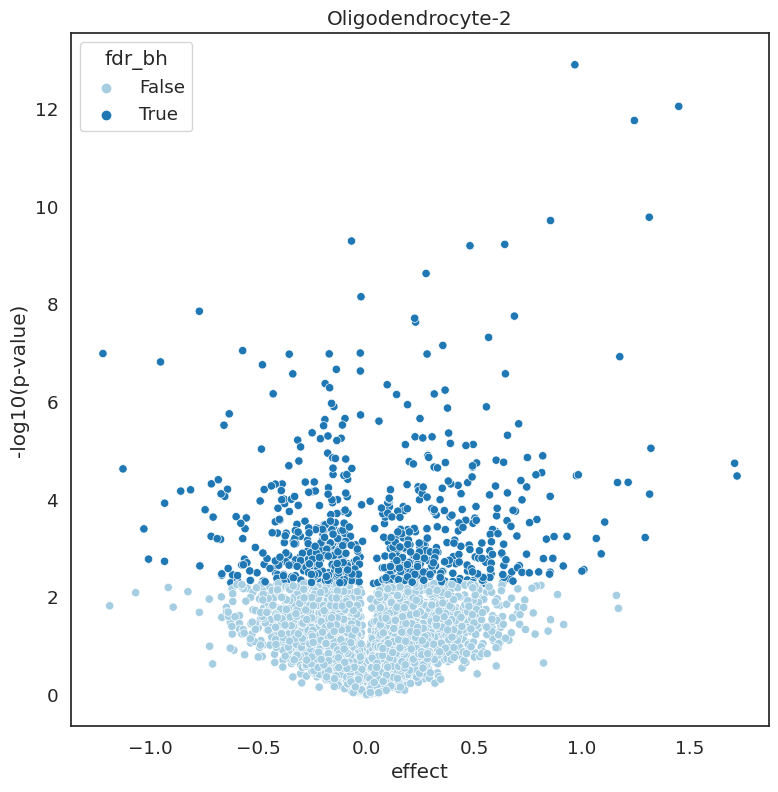

*** InN ADARB2 VIP glmmTMB results ***


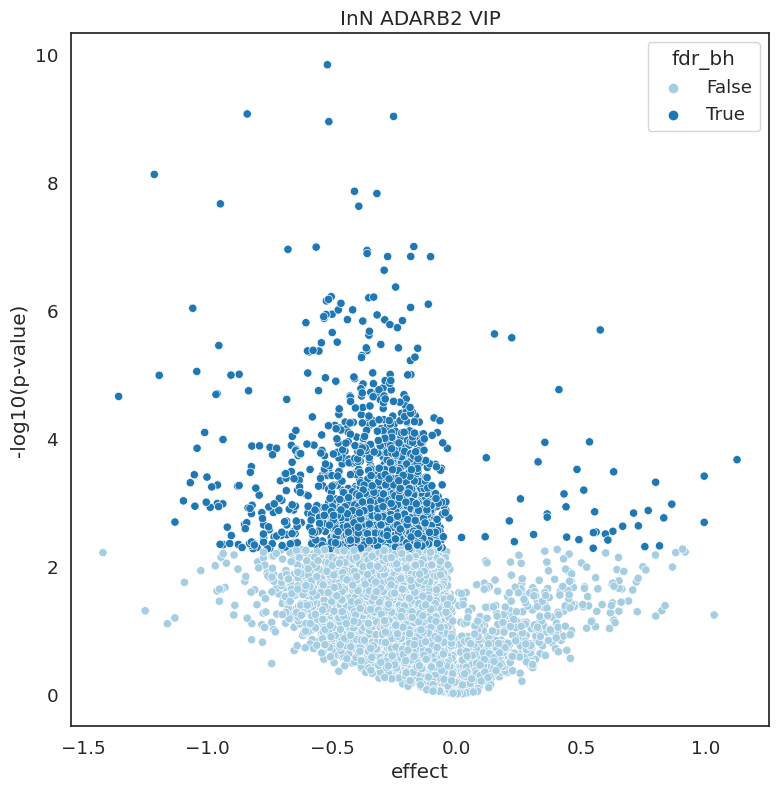

*** InN LHX6 PVALB glmmTMB results ***


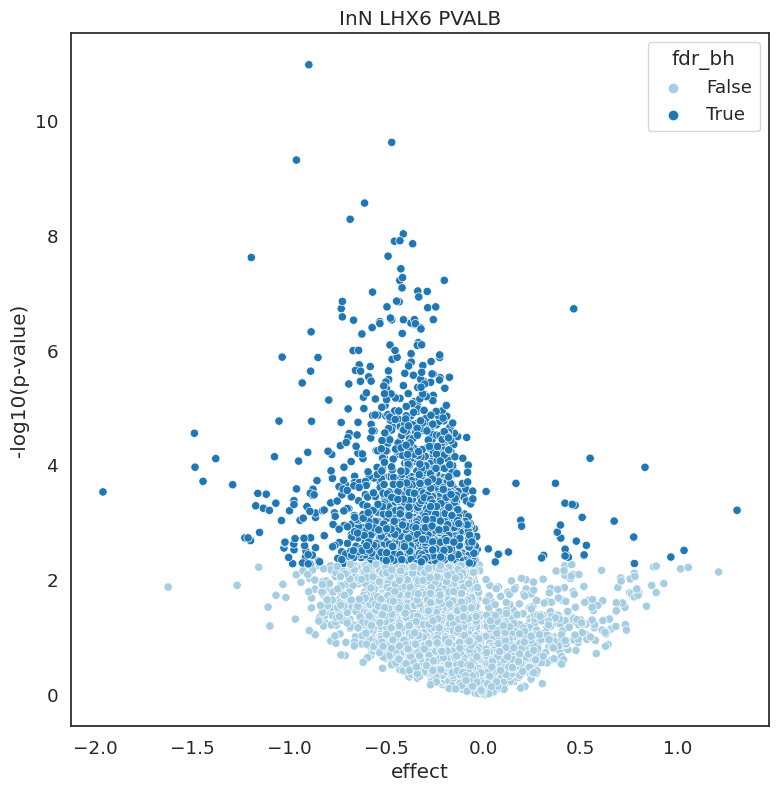

*** ExN FEZF2 glmmTMB results ***


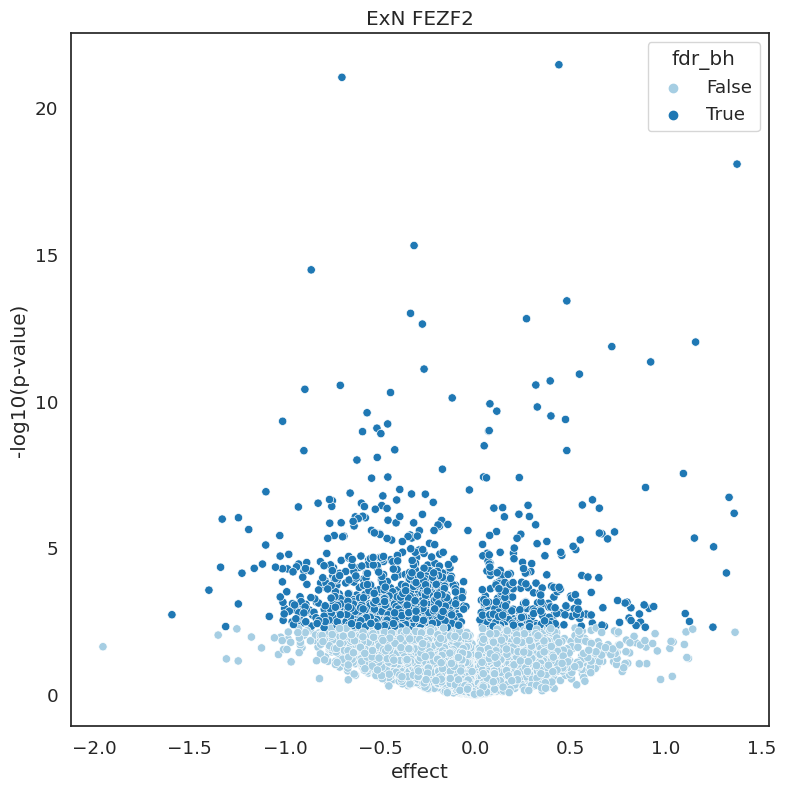

*** OPC glmmTMB results ***


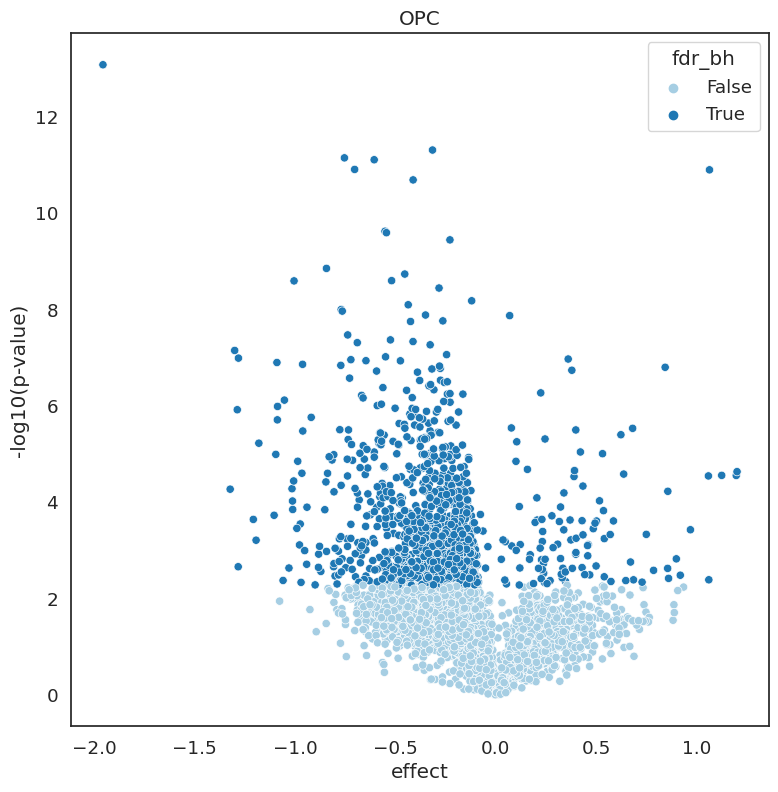

*** ExN THEMIS glmmTMB results ***


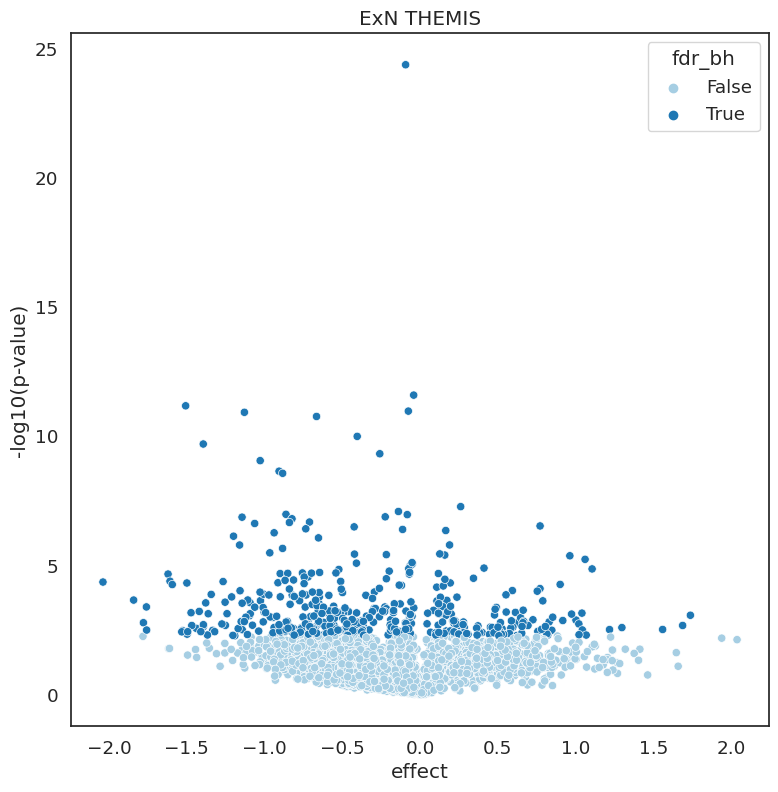

*** ExN CUX2 ADARB2 glmmTMB results ***


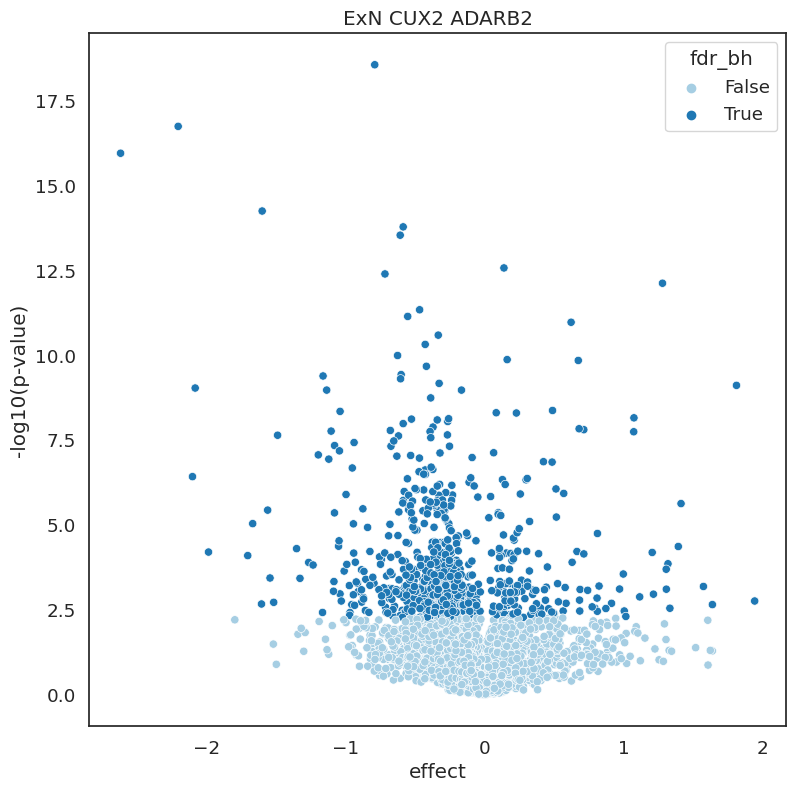

*** Mural glmmTMB results ***


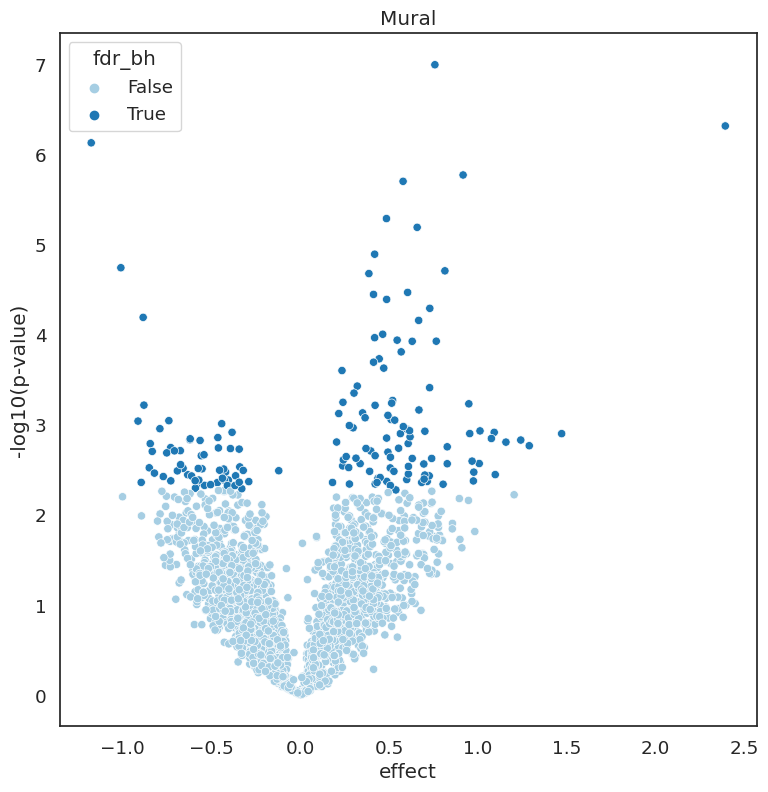

*** Microglia glmmTMB results ***


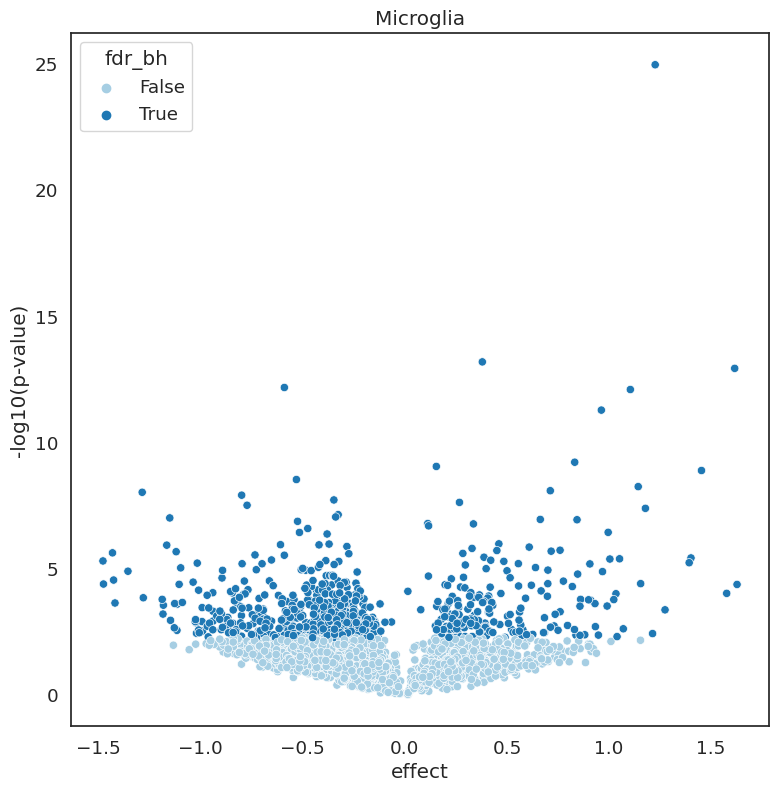

*** SPN D1-2 glmmTMB results ***


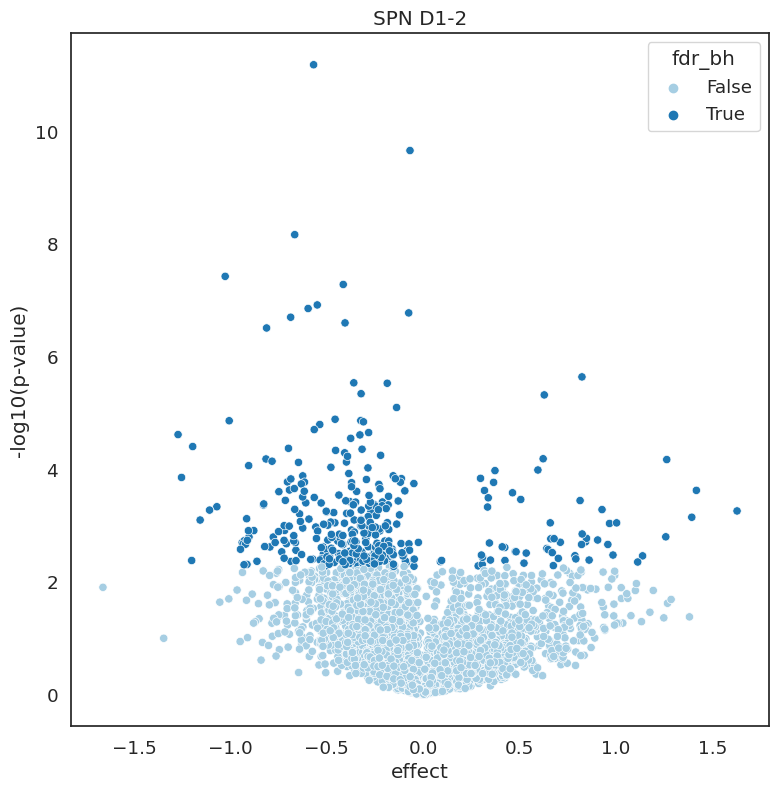

*** Oligodendrocyte-3 glmmTMB results ***


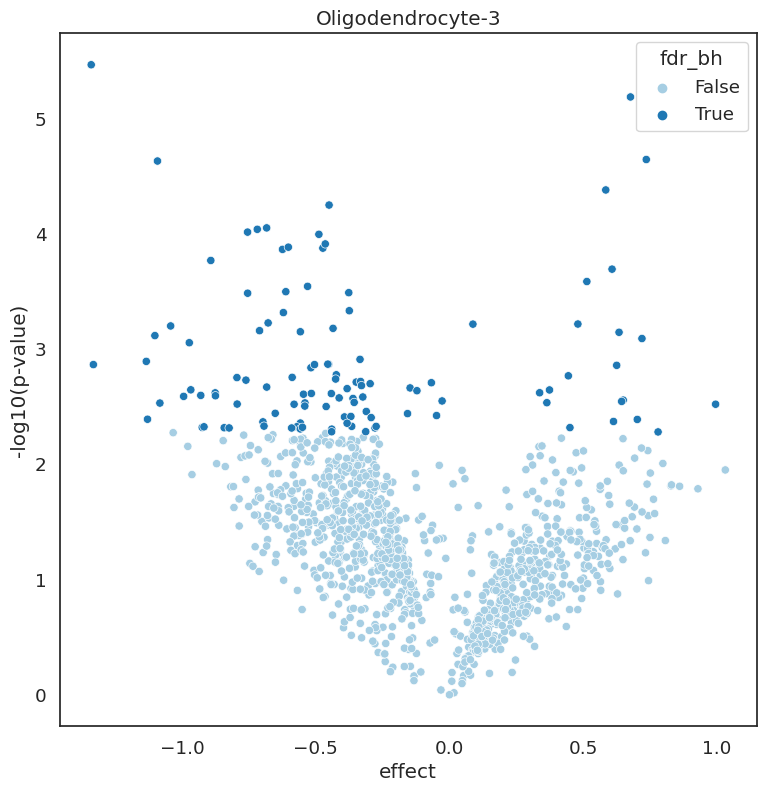

*** Endothelial glmmTMB results ***


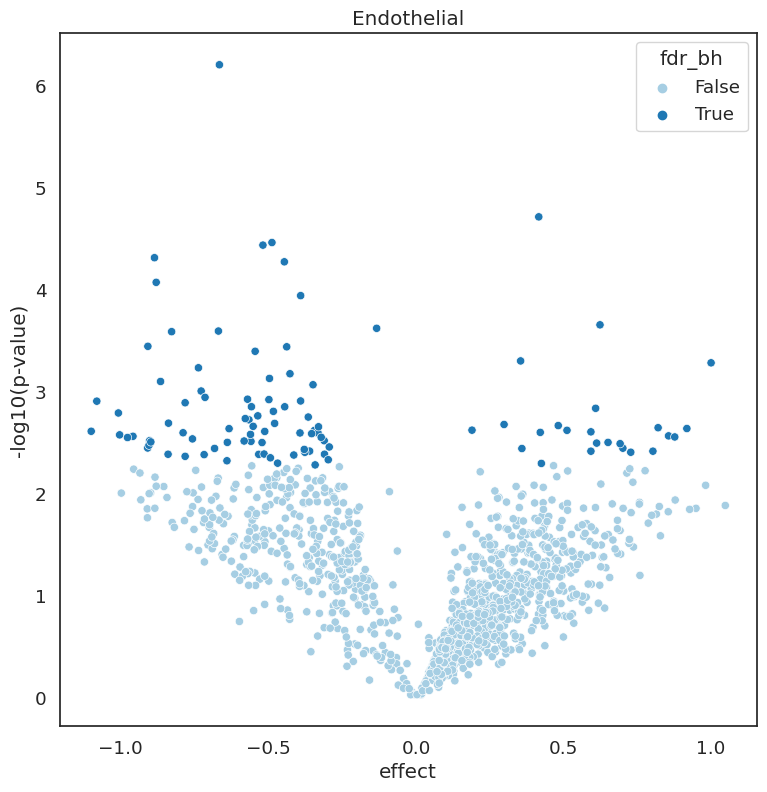

*** SPN D1 glmmTMB results ***


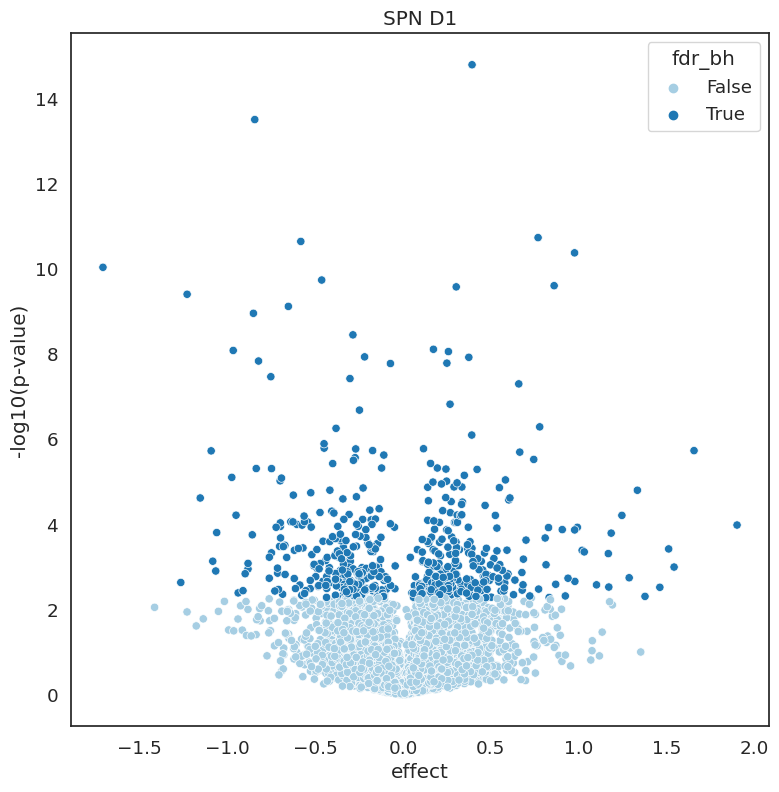

*** SPN D2 glmmTMB results ***


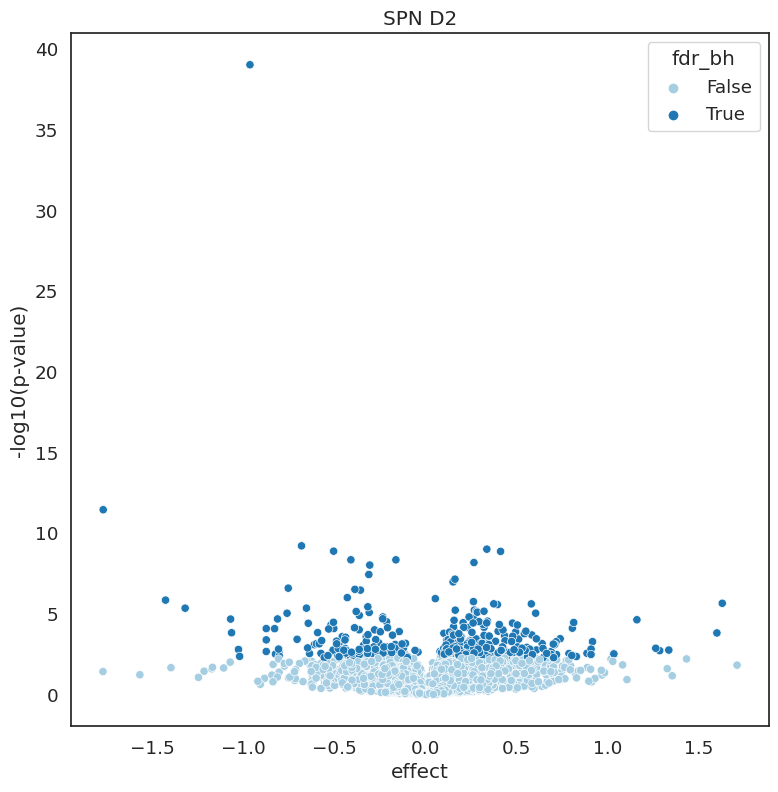

*** Ependymal glmmTMB results ***


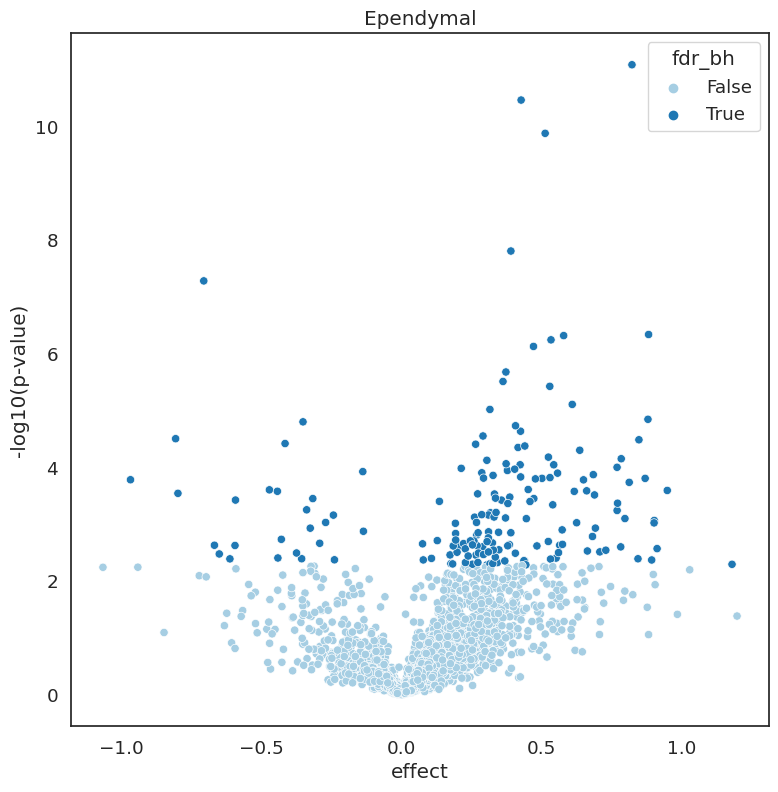

*** SPN D2-2 glmmTMB results ***


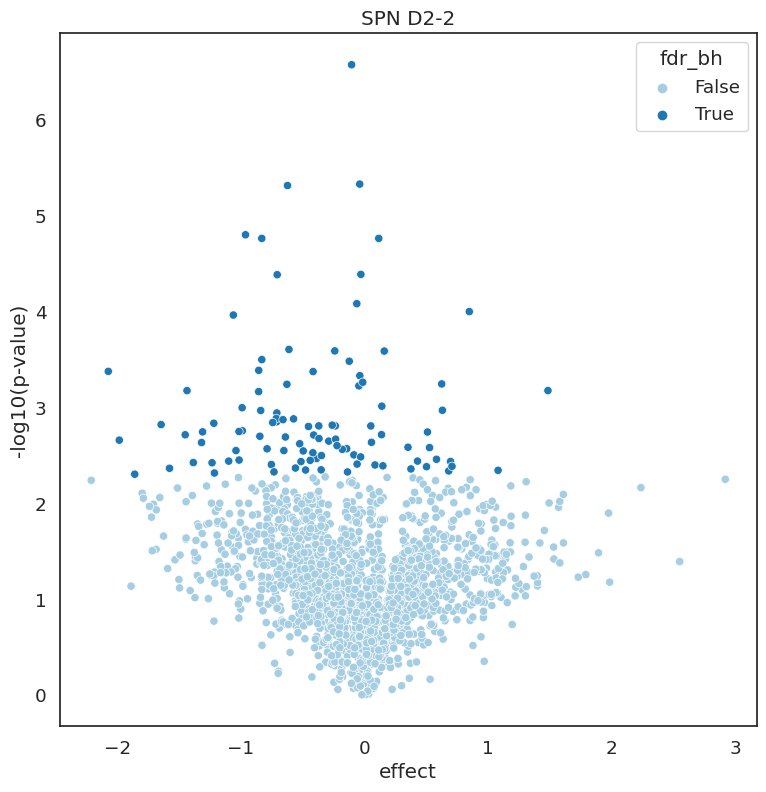

*** ExN LAMP5 glmmTMB results ***


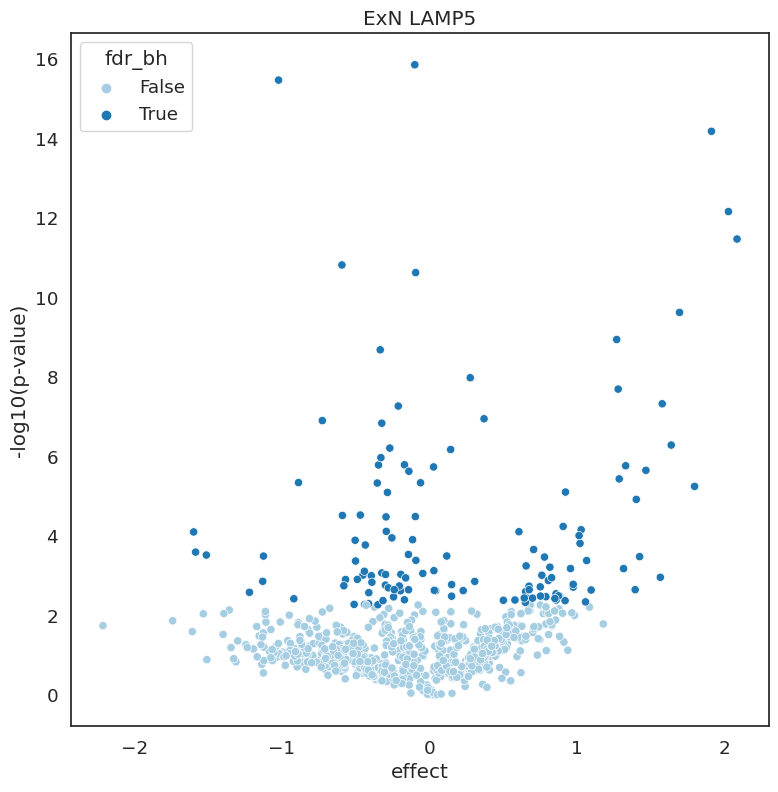

In [20]:
print('---- all glmmTMB results ----')
volcano_plot(glmmtmb_results)

print('---- broad cell-type glmmTMB results ----')
temp_results = glmmtmb_results.loc[glmmtmb_results.type == 'broad_celltype']
for tissue in temp_results['tissue'].unique():
    print(f'*** {tissue} glmmTMB results ***')
    volcano_plot(temp_results.loc[temp_results['tissue'] == tissue], title=tissue)

print('---- per region broad cell-type glmmTMB results ----')
temp_results = glmmtmb_results.loc[glmmtmb_results.type == 'region_broad_celltype']
for tissue in temp_results['tissue'].unique():
    print(f'*** {tissue} glmmTMB results ***')
    volcano_plot(temp_results.loc[temp_results['tissue'] == tissue], title=tissue)

print('---- specific cell-types glmmTMB results ----')
temp_results = glmmtmb_results.loc[glmmtmb_results.type == 'specific_celltype']    
for tissue in temp_results['tissue'].unique():
    print(f'*** {tissue} glmmTMB results ***')    
    volcano_plot(temp_results.loc[temp_results['tissue'] == tissue], title=tissue)

In [21]:
if DEBUG:
    display(glmmtmb_results.sample(10))

,feature,intercept,estimate,std.error,statistic,p.value,tissue,type,fdr_bh
2319,DOCK10,-0.535058,-0.045298,0.156681,-0.289112,0.772495,Middle temporal gyrus ExN,region_broad_celltype,0.855899
2133,CDC37L1,-1.220076,0.018565,0.138426,0.134113,0.893313,Ependymal,specific_celltype,0.945821
696,GLS,0.680493,-0.070934,0.123877,-0.572615,0.566905,Ependymal,specific_celltype,0.690080
2709,HIGD1A,-1.277618,-0.064553,0.127294,-0.507121,0.612070,ExN,broad_celltype,0.727756
4111,EIF1AX,-0.686339,-0.192939,0.106692,-1.808375,0.070548,Microglia,broad_celltype,0.187704
10197,MFSD11,0.020709,-0.184076,0.063506,-2.898576,0.003749,InN ADARB2 VIP,specific_celltype,0.041673
4167,SV2C,-0.252800,-0.131940,0.149430,-0.882952,0.377262,Entorhinal cortex InN,region_broad_celltype,0.521268
1695,TMEM151B,-0.679517,0.417339,0.243211,1.715959,0.086170,Middle temporal gyrus SPN,region_broad_celltype,0.209139
4315,TM9SF1,-2.748318,0.141468,0.086229,1.640611,0.100878,Oligodendrocyte-2,specific_celltype,0.228651
5979,XPO6,0.202927,-0.058650,0.048011,-1.221584,0.221865,Putamen Oligodendrocyte,region_broad_celltype,0.367827


### look at some of the individual results

##### max significant by p-value

feature                      GRID1
intercept                 1.437666
estimate                 -0.067999
std.error                    0.005
statistic               -13.598601
p.value                        0.0
tissue                 Putamen SPN
type         region_broad_celltype
fdr_bh                         0.0
Name: 8296, dtype: object


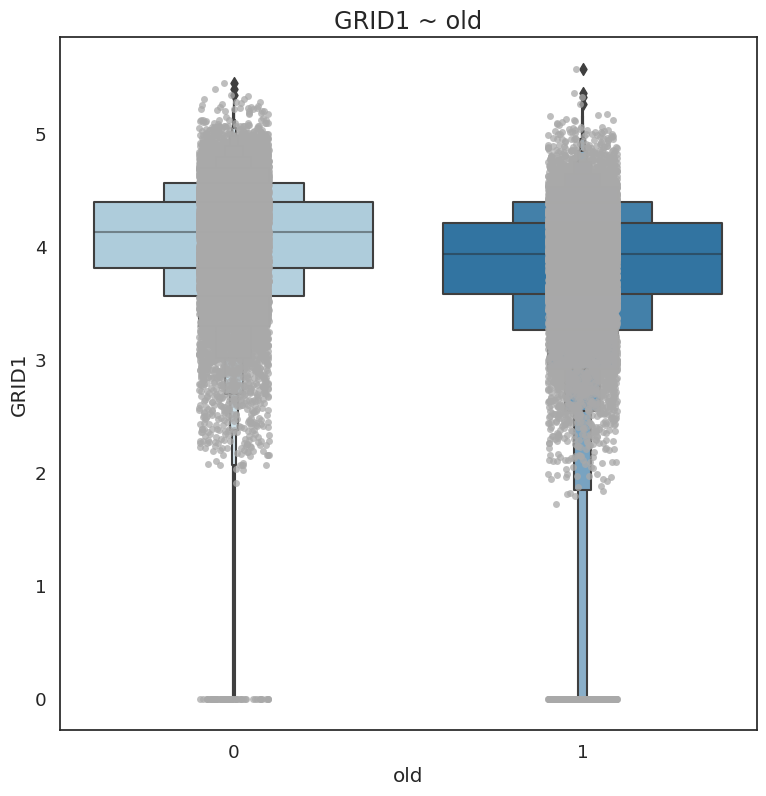

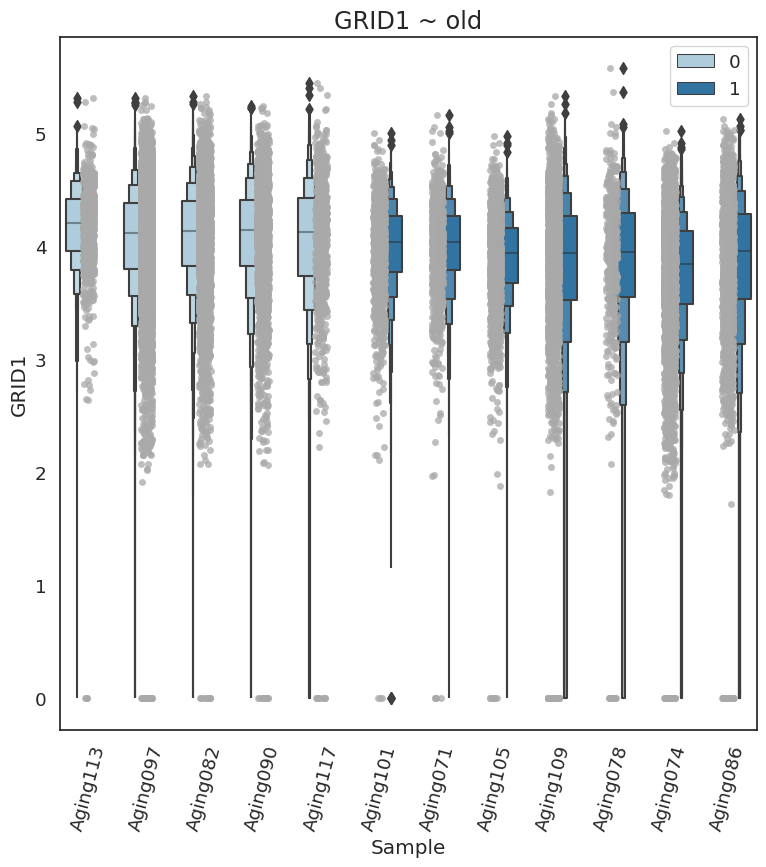

feature                      GRID1
intercept                 1.437666
estimate                 -0.067999
std.error                    0.005
statistic               -13.598601
p.value                        0.0
tissue                 Putamen SPN
type         region_broad_celltype
fdr_bh                         0.0
Name: 8296, dtype: object


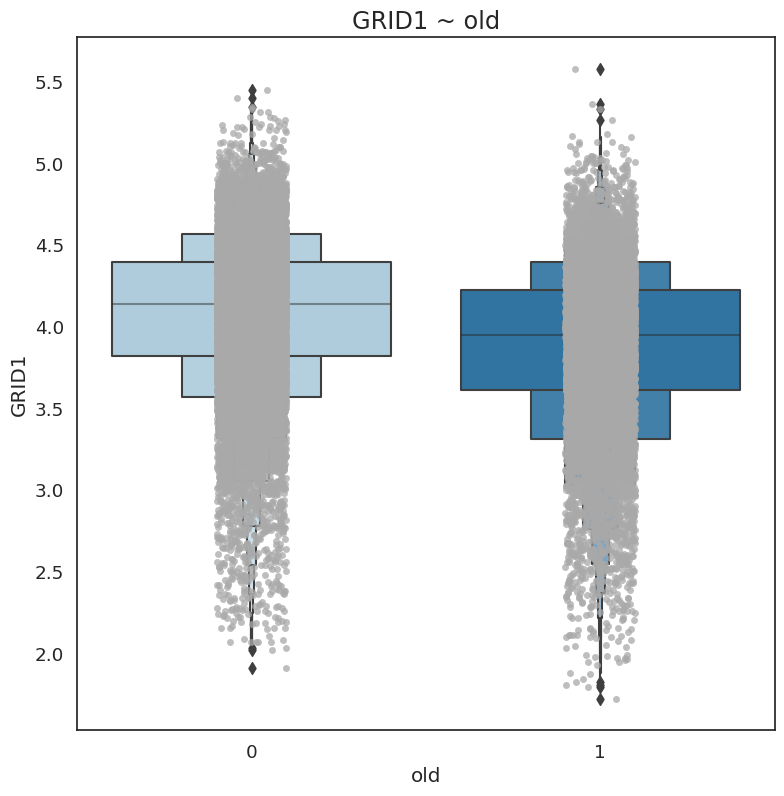

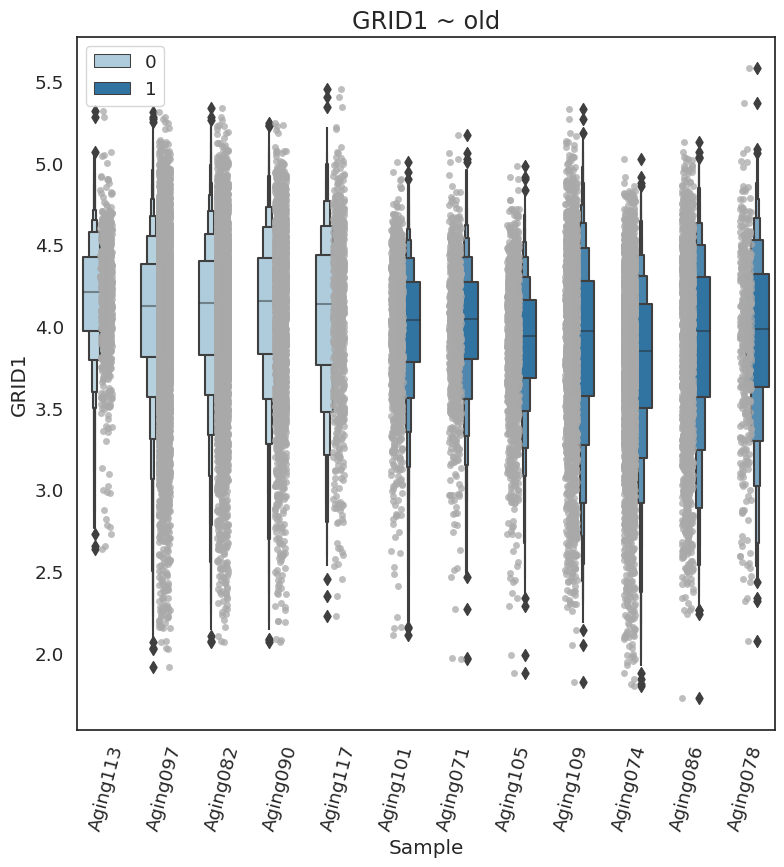

In [22]:
this_results = glmmtmb_results.loc[glmmtmb_results['p.value'] == min(glmmtmb_results['p.value'])]
this_hit = this_results.sort_values(by=['estimate'], ascending=False).iloc[0]
prep_plot_feature(adata, this_hit)
prep_plot_feature(adata, this_hit, filter_zeros=True)

#### max significant by estimate (increasing)

feature                    C1orf87
intercept                -3.492559
estimate                  2.513994
std.error                 0.608156
statistic                 4.133795
p.value                   0.000036
tissue           Putamen Astrocyte
type         region_broad_celltype
fdr_bh                    0.002554
Name: 72, dtype: object


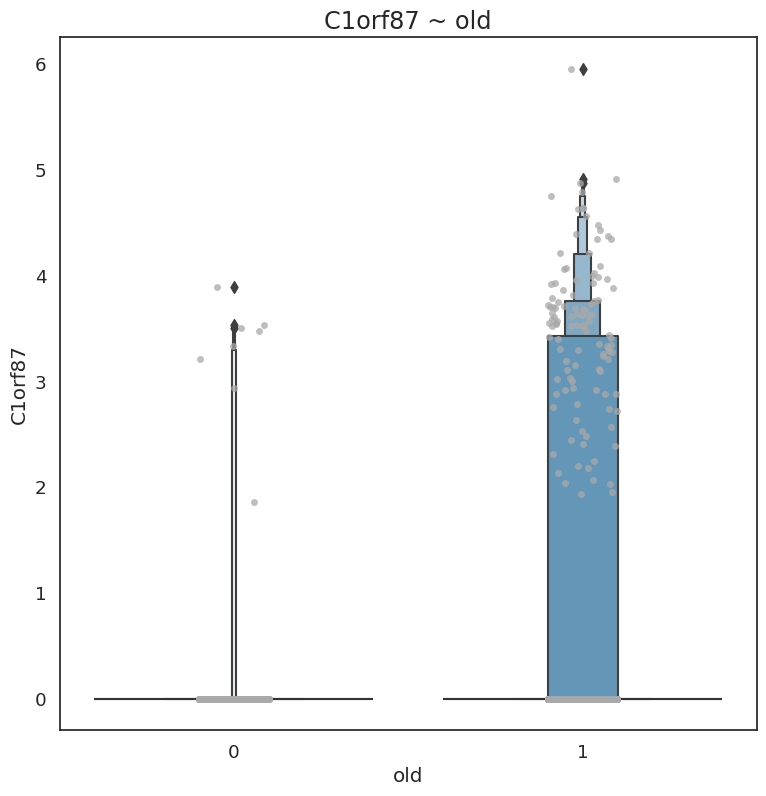

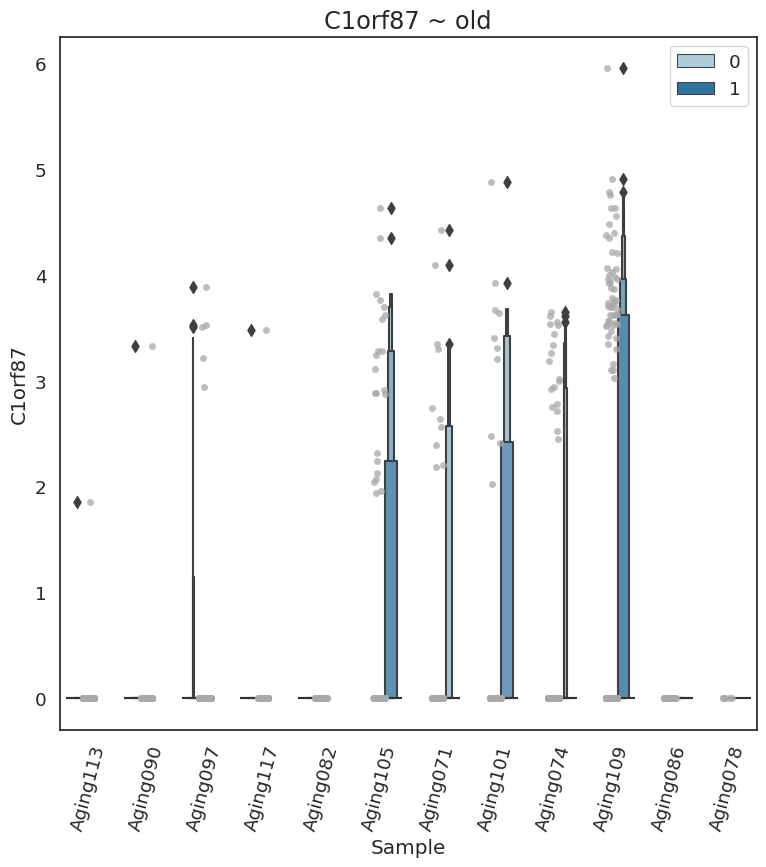

feature                    C1orf87
intercept                -3.492559
estimate                  2.513994
std.error                 0.608156
statistic                 4.133795
p.value                   0.000036
tissue           Putamen Astrocyte
type         region_broad_celltype
fdr_bh                    0.002554
Name: 72, dtype: object


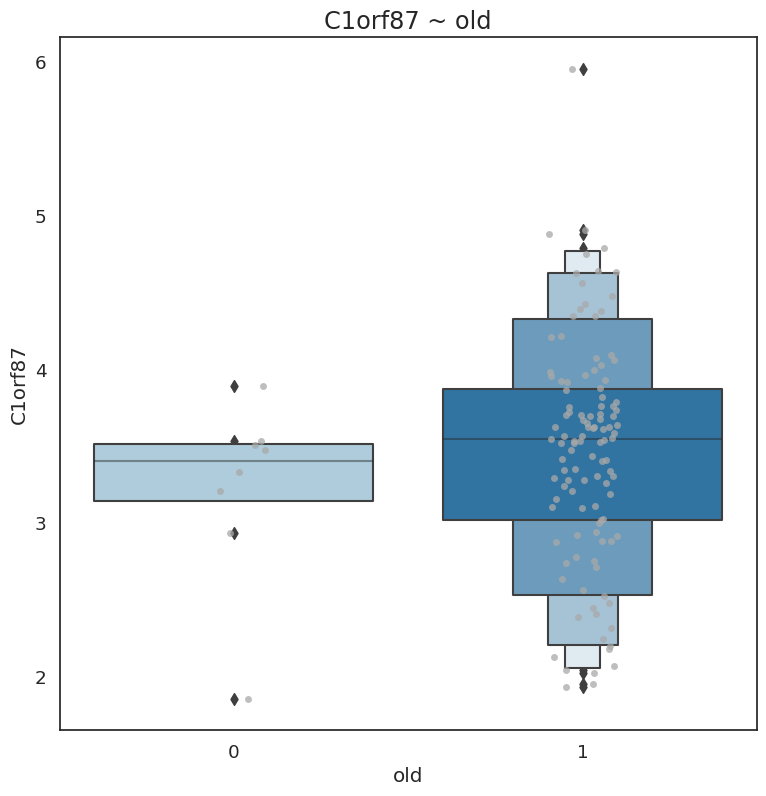

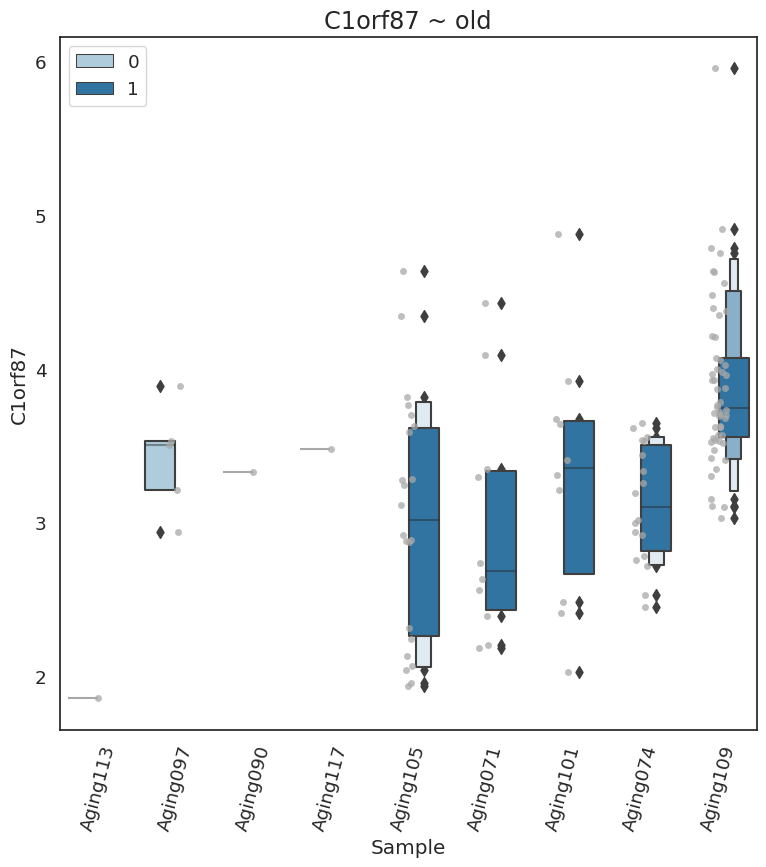

In [23]:
sig_results = glmmtmb_results.loc[glmmtmb_results['fdr_bh'] < 0.05]
this_results = sig_results.loc[sig_results['estimate'] == max(sig_results['estimate'])]
this_hit = this_results.sort_values(by=['estimate'], ascending=False).iloc[0]
prep_plot_feature(adata, this_hit)
prep_plot_feature(adata, this_hit, filter_zeros=True)

##### random results

feature                         AP005329.2
intercept                        -2.105294
estimate                          0.676423
std.error                         0.233497
statistic                         2.896928
p.value                           0.003768
tissue       Subventricular zone Astrocyte
type                 region_broad_celltype
fdr_bh                            0.041793
Name: 3602, dtype: object


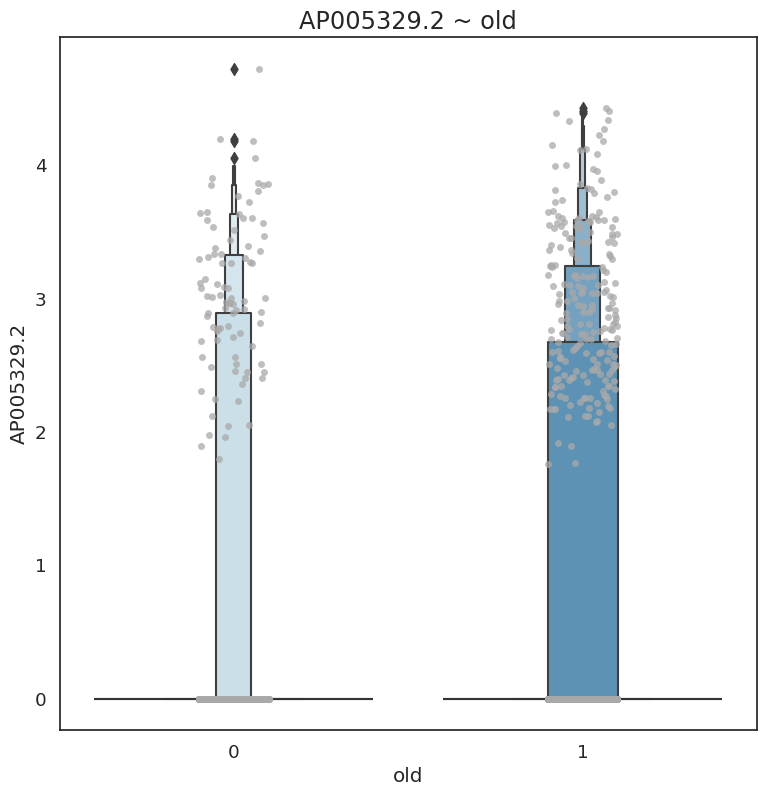

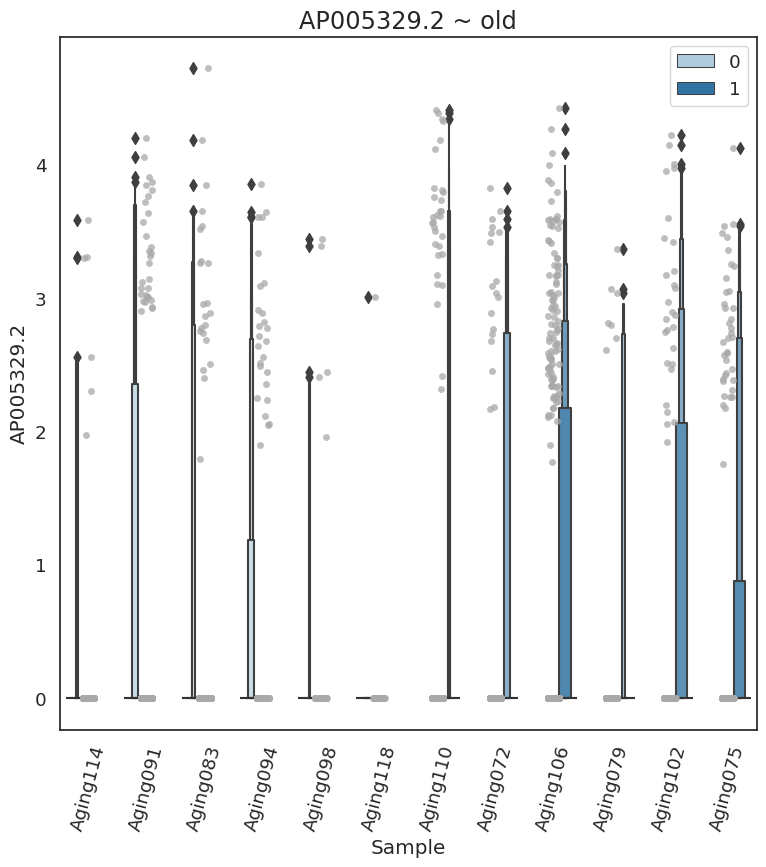

feature                         AP005329.2
intercept                        -2.105294
estimate                          0.676423
std.error                         0.233497
statistic                         2.896928
p.value                           0.003768
tissue       Subventricular zone Astrocyte
type                 region_broad_celltype
fdr_bh                            0.041793
Name: 3602, dtype: object


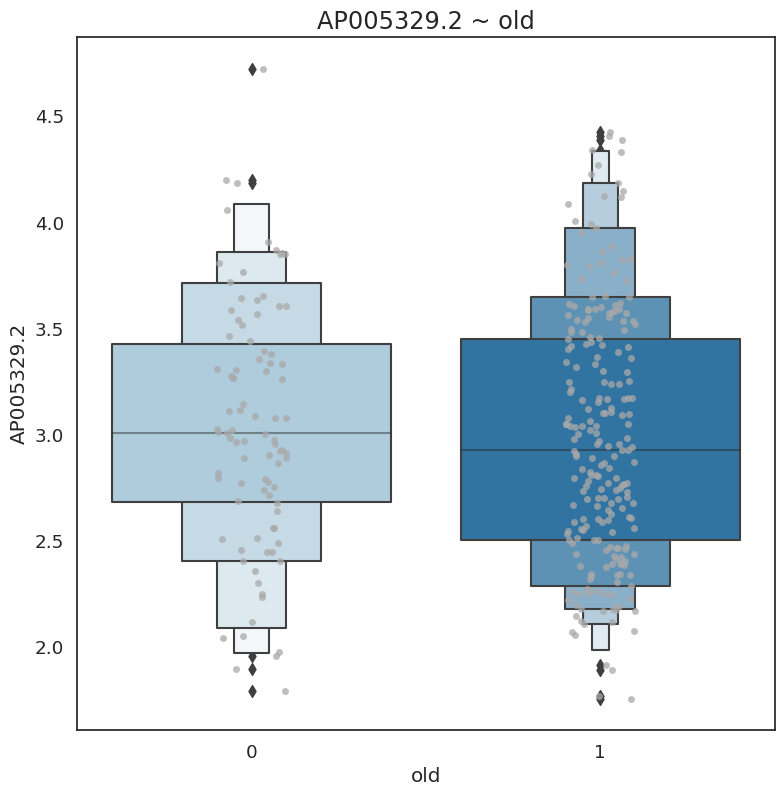

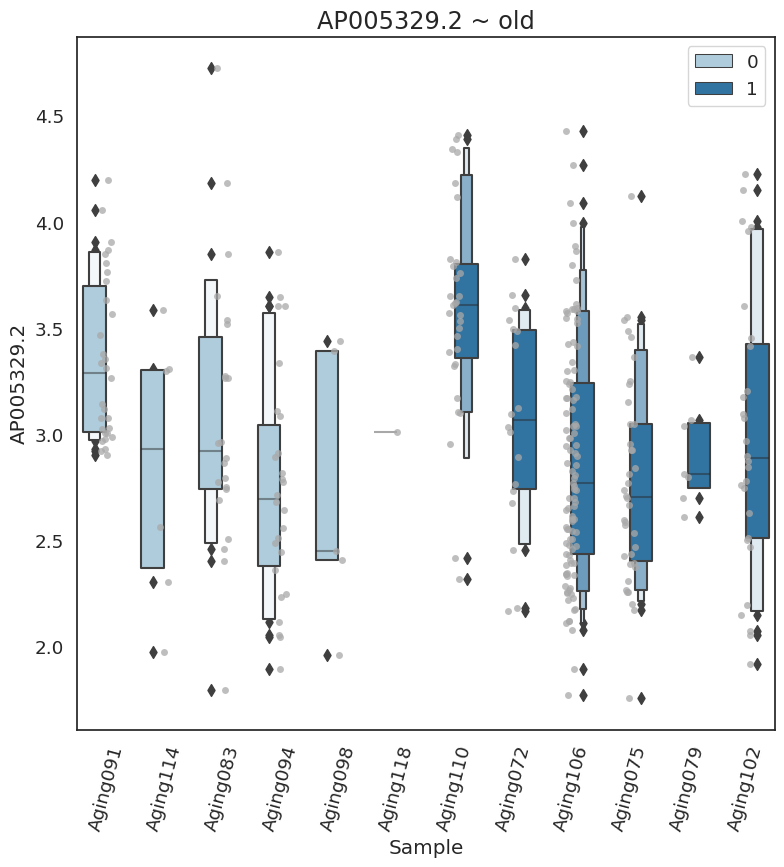

In [24]:
# random
this_hit = sig_results.sample().iloc[0]
prep_plot_feature(adata, this_hit)
prep_plot_feature(adata, this_hit, filter_zeros=True)

##### max non-significat by coef (increasing)

feature                    AGA
intercept           -24.085516
estimate             22.323139
std.error         14033.819599
statistic             0.001591
p.value               0.998731
tissue                SPN D2-2
type         specific_celltype
fdr_bh                     1.0
Name: 539, dtype: object


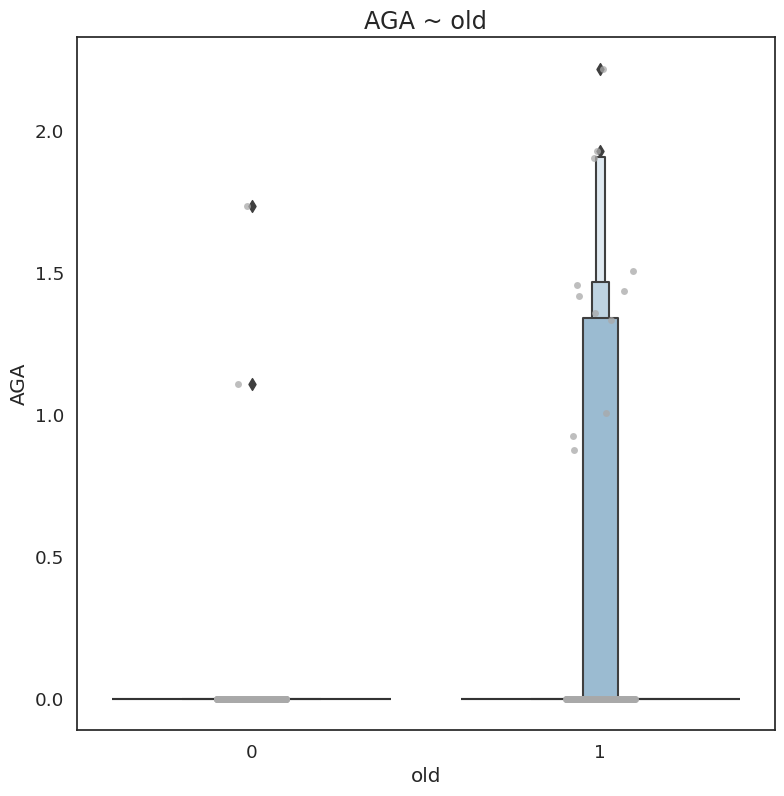

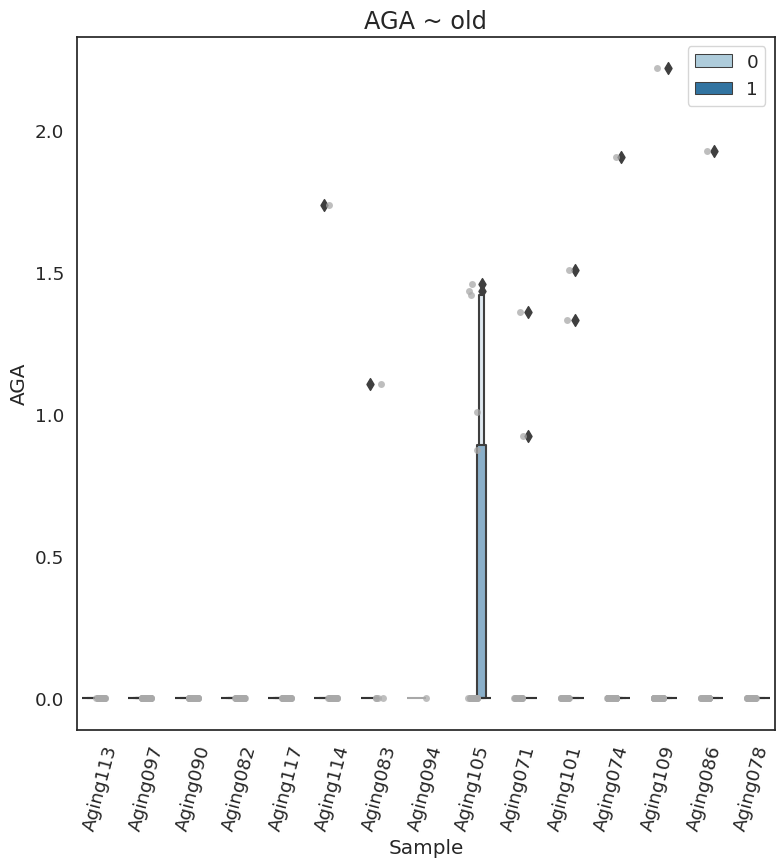

feature                    AGA
intercept           -24.085516
estimate             22.323139
std.error         14033.819599
statistic             0.001591
p.value               0.998731
tissue                SPN D2-2
type         specific_celltype
fdr_bh                     1.0
Name: 539, dtype: object


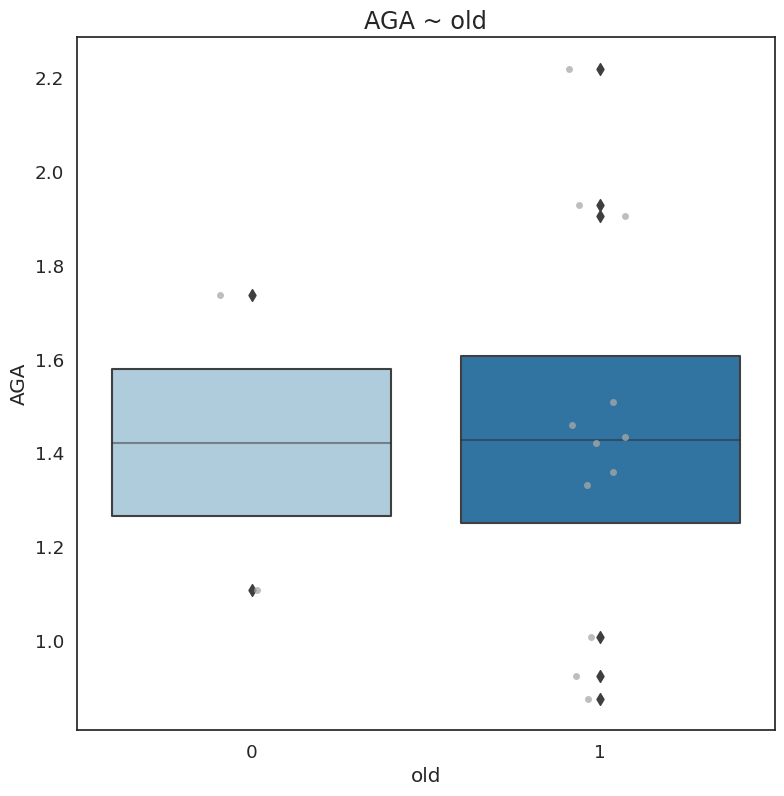

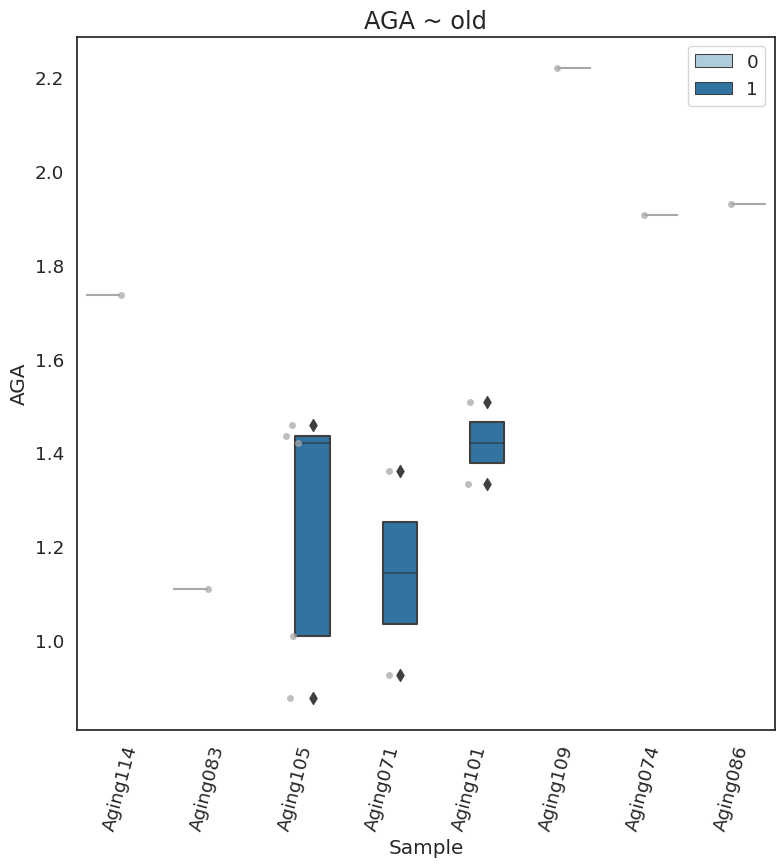

In [25]:
nonsig_results = glmmtmb_results.loc[(glmmtmb_results['fdr_bh'] > 0.05) & 
                                     (~glmmtmb_results['statistic'].isna())]
this_results = nonsig_results.loc[nonsig_results['estimate'] == max(nonsig_results['estimate'])]
this_hit = this_results.sort_values(by=['estimate'], ascending=True).iloc[0]
prep_plot_feature(adata, this_hit)
prep_plot_feature(adata, this_hit, filter_zeros=True)

In [26]:
!date

Wed Jan  3 20:46:48 UTC 2024
